# Stage 2: Advanced Embedding Models Training and Analysis
## Sentence Embeddings
---

### Team 7: Nicole Bolliger, Vitalia Vedenikova

## Import relevant libraries

In [ ]:
# Installations
!pip install langdetect
!pip install unidecode
!pip install sentence-transformers
!pip install keybert
!pip install spacy
!python -m spacy download en_core_web_sm


In [ ]:
# Import
import pandas as pd
import json
import re
import spacy
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from bs4 import BeautifulSoup
import unidecode
import random
import nltk
nltk.download('punkt')
nltk.download('punkt_tab')
import torch
import warnings


from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import silhouette_score
from spacy.lang.en import English
from langdetect import detect, detect_langs, DetectorFactory
from collections import Counter

#GloVe
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec
from gensim.scripts.glove2word2vec import glove2word2vec
from sklearn.metrics.pairwise import cosine_similarity
from itertools import product
from scipy.stats import spearmanr
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

#Doc2Vec
from gensim.models.keyedvectors import KeyedVectors
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import sent_tokenize, word_tokenize
from scipy.spatial.distance import cdist
from keybert import KeyBERT

#Sentence-BERT
from transformers import AutoTokenizer
from sentence_transformers import SentenceTransformer
from torch.utils.data import DataLoader

#DistilBERT
from gensim.utils import tokenize

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


## 1. Data Cleaning and Preparation for Sentences Embeddings

### 1.1. Load and Clean the Datasets

The cleaning steps are very similar to the ones seen previously. They will however not be as extensive as in stage 1 or for word embeddings since we are trying to preserve semantic nuances.

In [ ]:
## Loading the data sets

from google.colab import drive
drive.mount('/content/drive')
!pwd
!ls '/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/'
#Import csv data into dataframes
media_df = pd.read_csv('drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/cleantech_media_dataset_v3_2024-10-28.csv')
patent_json = []  # Initialize patent_json outside the try-except block

file_path = '/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/CleanTech_22-24_updated.json'

with open(file_path) as f:
    try:
        # Try loading the entire file as a single JSON object
        patent_json = json.load(f)
    except json.JSONDecodeError:
        # If loading as a single JSON object fails
        f.seek(0)  # Reset the file pointer to the beginning

        # Iterate through each line in the file
        for line in f:
            try:
                # Attempt to parse each line as a JSON object
                data = json.loads(line)
                # Append the parsed JSON object to patent_json list
                patent_json.append(data)
            except json.JSONDecodeError as e:
                # If a line is not valid JSON, print an error message
                print(f"Skipping invalid line: {line.strip()} - Error: {e}")

# Convert dictionary to JSON string
json_string = json.dumps(patent_json)

# Convert nested JSON data to Pandas DataFrame
patent_df = pd.read_json(json_string, orient='records')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content
CleanTech_22-24_updated.json		   df_patent_v2.csv  patent_test.csv
cleantech_media_dataset_v3_2024-10-28.csv  media_test.csv    patent_train.csv
df_media_v2.csv				   media_train.csv   project_dataset.zip


<ipython-input-32-98ea7c87d27e>:36: FutureWarning: Passing literal json to 'read_json' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  patent_df = pd.read_json(json_string, orient='records')


In [ ]:
## Media data set cleaning

# remove author and unnamed column
media_df = media_df.drop(['author','Unnamed: 0'], axis= 1)

#The title and content are cast as string data types
media_df[['content', 'title']].dtypes

# We remove all content not in english
print(f"The current amount of articles is : {len(media_df)}")
detected_languages = [detect_langs(text) for text in media_df['content'].astype(str)]
media_df['detected_language'] = detected_languages

DetectorFactory.seed = 0

flattened_languages = [lang.lang[:2] if lang else 'unknown' for sublist in detected_languages for lang in sublist]

counts = Counter(flattened_languages)

language_stats = pd.DataFrame.from_dict(counts, orient='index', columns=['Count'])
en_count = language_stats.loc[language_stats.index.str.startswith('en', na=False), 'Count'].sum()
print(f"Number of times 'en' appears: {en_count}")

media_df['is_en'] = media_df['detected_language'].apply(lambda langs: any(lang.lang.startswith('en') for lang in langs))
media_df = media_df[media_df['is_en']]
print(f"The amount of articles now is: {len(media_df)}")

media_df = media_df.drop(['detected_language','is_en'], axis= 1)

# Create a separate column for the cleaned content:
media_df['clean_content'] = media_df['content']

# Lowercasing the clean_content:
media_df['clean_content'] = media_df['clean_content'].str.lower()

# Remove HTML tags
def remove_html(df, section):
    df[f'{section}'] = df[f'{section}'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
    return df

media_df = remove_html(media_df, 'clean_content')

def remove_emoji(text):
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticons
                               u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                               u"\U0001F680-\U0001F6FF"  # transport & map symbols
                               u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                               u"\U00002500-\U00002BEF"  # chinese char
                               u"\U00002702-\U000027B0"
                               u"\U00002702-\U000027B0"
                               u"\U000024C2-\U0001F251"
                               u"\U0001f926-\U0001f937"
                               u"\U00010000-\U0010ffff"
                               u"\u2640-\u2642"
                               u"\u2600-\u2B55"
                               u"\u200d"
                               u"\u23cf"
                               u"\u23e9"
                               u"\u231a"
                               u"\ufe0f"  # dingbats
                               u"\u3030"
                               "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

media_df['clean_content'] = media_df['clean_content'].apply(lambda x: remove_emoji(x))

# removing copyright information
def remove_text_after_copyright(text):
  match = re.search(r"(©|copyright ©).*", text)
  if match:
    return text[:match.start()]
  return text

media_df['clean_content'] = media_df['clean_content'].apply(remove_text_after_copyright)

def remove_text_after_certain_string(text, search_string):
  """Removes text after a specific string from a given text."""
  match = re.search(rf"({search_string}).*", text)
  if match:
    return text[:match.start()]
  return text

def remove_text_between_phrases(text, phrase_1, phrase_2):
  """Removes text between two given phrases."""
  phrase_1 = re.escape(phrase_1)
  phrase_2 = re.escape(phrase_2)
  pattern = rf"{phrase_1}.*?{phrase_2}"
  cleaned_text = re.sub(pattern, "", text, flags=re.DOTALL)
  return cleaned_text

# For pv-magazine
search_string = "this content is protected by copyright and may not be reused"
for index, row in media_df[media_df["domain"] == "pv-magazine"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

# For naturalgasintel
phrase_1 = "sign in to get the best natural gas news"
phrase_2 = "ngi all news access"
for index, row in media_df[media_df["domain"] == "naturalgasintel"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_between_phrases(row['clean_content'], phrase_1, phrase_2)

# For solarindustrymag
phrase_1 = "solar industry offers"
phrase_2 = "stay current and navigate the solar market"
for index, row in media_df[media_df["domain"] == "solarindustrymag"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_between_phrases(row['clean_content'], phrase_1, phrase_2)

# For energy-xprt
phrase_1 = "no comments"
phrase_2 = "first to comment"
for index, row in media_df[media_df["domain"] == "energy-xprt"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_between_phrases(row['clean_content'], phrase_1, phrase_2)

search_string = "energy xprt is a global|need help finding the right suppliers"
for index, row in media_df[media_df["domain"] == "energy-xprt"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

# For azocleantech
search_string = "hi i m azthena you can trust"
for index, row in media_df[media_df["domain"] == "azocleantech"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

# For rechargenews
search_string = "recharge is part of dn media group"
for index, row in media_df[media_df["domain"] == "rechargenews"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

#For solarpowerportal.co
search_string = "thank you for subscribing"
for index, row in media_df[media_df["domain"] == "solarpowerportal.co"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

#For greenprophet
phrase_1 = "windowdojorequire"
phrase_2 = "uniquemethods true"
for index, row in media_df[media_df["domain"] == "greenprophet"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_between_phrases(row['clean_content'], phrase_1, phrase_2)

#For ecofriend
search_string = "ecofriendcom a dr prem guides"
for index, row in media_df[media_df["domain"] == "ecofriend"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

#For eurosolar
search_string = "europäische vereinigung"
for index, row in media_df[media_df["domain"] == "eurosolar"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

search_string = "independent of political parties"
for index, row in media_df[media_df["domain"] == "eurosolar"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

#For greenairnews
search_string = "sustainability in the air is the first podcast"
for index, row in media_df[media_df["domain"] == "greenairnews"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

#For all-energy
search_string = "your email address will not be published"
for index, row in media_df[media_df["domain"] == "all-energy"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

#For iea
search_string = "get updates on the iea’ s latest news"
for index, row in media_df[media_df["domain"] == "iea"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

phrase_1 = "create a free iea account"
phrase_2 = "to a paid service"
for index, row in media_df[media_df["domain"] == "iea"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_between_phrases(row['clean_content'], phrase_1, phrase_2)

#For decarbxpo
search_string = "to use the full function of this web site"
for index, row in media_df[media_df["domain"] == "decarbxpo"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

#For biofuels-news
search_string = "it's the leading magazine covering all"
for index, row in media_df[media_df["domain"] == "biofuels-news"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

#For solarquarter
search_string = "this site uses akismet"
for index, row in media_df[media_df["domain"] == "solarquarter"].iterrows():
    media_df.loc[index, 'clean_content'] = remove_text_after_certain_string(row['clean_content'], search_string)

#Replace symbols
def replace_symbols(text, symbol_map):
  for symbol, replacement in symbol_map.items():
    text = text.replace(symbol, replacement)
  return text

symbol_mapping = {
       '$': 'dollar ',
       '~': 'approximately',
       '%': ' percent',
       '£': 'pound ',
       '€': 'euro ',
       '₹': 'rupee ',
       '¥': ' yen',
       'gw': ' gigawatt',
       'mw': ' megawatt',
       'kw': ' kilowatt',
       'm2': ' square meter',
       'kg': ' kilogram',
       'm3': ' cubic meter',
       '°f': ' degree fahrenheit',
       '°c': ' degree celsius',
       '°k': ' degree kelvin',
       'year': ' year',
       '...' : ' ',
       'rmb' : 'renminbi ',
       'gwdc': ' gigawatts-direct current',
       'mwp' : ' megawatt peak',
       'mwh' : 'megawatt-hour',
       'gwh': ' gigawatt-hour',
       'degree': ' degree',
       'hz': ' hertz'
   }

media_df['clean_content'] = media_df['clean_content'].apply(lambda x: replace_symbols(x, symbol_mapping))

# remove whitespaces
def remove_whitespaces(text):
  return " ".join(text.split())

media_df['clean_content'] = media_df['clean_content'].apply(remove_whitespaces)

#accented to ascii
def accented_to_ascii(text):
    return unidecode.unidecode(text)
media_df['clean_content'] = media_df['clean_content'].apply(accented_to_ascii)

The current amount of articles is : 20111
Number of times 'en' appears: 20108
The amount of articles now is: 20108


In [ ]:
## Patent data set cleaning:

# Application number handling:
patent_df = patent_df.groupby('publication_number', as_index=False).agg({
    'application_number': 'first',  # Keep the first application number
    'country_code': 'first',        # Keep the first country code
    'title': 'first',     # Keep the first title
    'abstract': 'first',  # Keep the first abstract
    'publication_date': 'first',    # Keep the first publication date
    'inventor': 'first',           # Keep the first inventor
    'cpc_code': lambda x: ', '.join(x.astype(str))  # Concatenate 'cpc' values
})

patent_df = patent_df.drop('application_number', axis= 1)

#correct data types:
patent_df['publication_date'] = pd.to_datetime(patent_df['publication_date'], format='%Y%m%d')

# We cast the following as string data types:
columns_to_cast = ['abstract', 'title', 'inventor']

for column in columns_to_cast:
    patent_df[column] = patent_df[column].astype('string')

patent_df[['abstract', 'title','inventor']].dtypes

# We check if all the abstracts are in english
detected_languages = [detect_langs(text) for text in patent_df['abstract'].astype(str)]
patent_df['detected_language'] = detected_languages

DetectorFactory.seed = 0

flattened_languages = [lang.lang[:2] if lang else 'unknown' for sublist in detected_languages for lang in sublist]

counts = Counter(flattened_languages)

language_stats = pd.DataFrame.from_dict(counts, orient='index', columns=['Count'])
en_count = language_stats.loc[language_stats.index.str.startswith('en', na=False), 'Count'].sum()
print(f"Number of times 'en' appears: {en_count}")

# We keep only the rows where the abstracts are in English (28'881 out of 31'366 records)
patent_df['is_en'] = patent_df['detected_language'].apply(lambda langs: any(lang.lang.startswith('en') for lang in langs))
patent_df = patent_df[patent_df['is_en']]

#clean inventor column:
def clean_inventor_names(name_string):
  cleaned_string = re.sub(r"[\[\]']", "", name_string)
  return cleaned_string

patent_df['inventor'] = patent_df['inventor'].apply(clean_inventor_names)

#create copy of abstracts
patent_df['clean_abstract'] = patent_df['abstract']

# Lowercasing
patent_df['clean_abstract'] = patent_df['clean_abstract'].str.lower()

#symbol handling:
symbol_mapping = {
       '%': ' percent',
       'gw': ' gigawatt',
       'mw': ' megawatt',
       'kw': ' kilowatt',
       'm2': ' square meter',
       'kg': ' kilogram',
       'm3': ' cubic meter',
       '°f': ' degree fahrenheit',
       '°c': ' degree celsius',
       '°k': ' degree kelvin',
       'gwdc': ' gigawatts-direct current',
       'mwp' : ' megawatt peak',
       'mwh' : 'megawatt-hour',
       'gwh': ' gigawatt-hour',
       'hz': ' hertz'
   }

patent_df['clean_abstract'] = patent_df['clean_abstract'].apply(lambda x: replace_symbols(x, symbol_mapping))

# remove extra whitespace
patent_df['clean_abstract'] = patent_df['clean_abstract'].apply(remove_whitespaces)

# remove not needed columns
patent_df.drop('detected_language', axis=1, inplace=True)
patent_df.drop('is_en', axis=1, inplace=True)

Number of times 'en' appears: 28881


<ipython-input-34-c01dda8a6212>:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  patent_df['inventor'] = patent_df['inventor'].apply(clean_inventor_names)
<ipython-input-34-c01dda8a6212>:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  patent_df['clean_abstract'] = patent_df['abstract']


### 1.2. Split into train and test data sets:

In [ ]:
media_train_sentence, media_test_sentence = train_test_split(media_df, test_size = 0.2, random_state = 42)
patent_train_sentence, patent_test_sentence = train_test_split(patent_df, test_size = 0.2, random_state = 42)

In [ ]:
# saving the test and train datasets (sentences)
media_train_sentence.to_csv('/content/drive/My Drive/CLTC_Project/content/media_train_sentence.csv', index=False)
media_test_sentence.to_csv('/content/drive/My Drive/CLTC_Project/content/media_test_sentence.csv', index=False)

In [ ]:
# saving patent test and train datasets (sentences)
patent_train.to_csv('/content/drive/My Drive/CLTC_Project/content/patent_train_sentence.csv', index=False)
patent_test.to_csv('/content/drive/My Drive/CLTC_Project/content/patent_test_sentence.csv', index=False)

## 3. Sentence Embeddings Training

### 3.1. To load the data sets directly into the environment

In [ ]:
# Load train and test datasets (sentences):
from google.colab import drive
drive.mount('/content/drive')
!pwd
!ls '/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/'
media_train_sentence = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/media_train_sentence.csv')
media_test_sentence = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/media_test_sentence.csv')
patent_train_sentence = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/patent_train_sentence.csv')
patent_test_sentence = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/patent_test_sentence.csv')

Mounted at /content/drive
/content
CleanTech_22-24_updated.json		   doc2vec_media_model.model	  media_train_sentence.csv
cleantech_media_dataset_v3_2024-10-28.csv  doc2vec_patent_model_dm.model  patent_test.csv
df_media_v2.csv				   doc2vec_patent_model.model	  patent_test_sentence.csv
df_patent_v2.csv			   glove.6B.zip			  patent_train.csv
distilbert_model			   media_test.csv		  patent_train_sentence.csv
distilbert_similarity_model.pth		   media_test_sentence.csv	  RG65.csv
doc2vec_media_model_dm.model		   media_train.csv		  sts-train.csv


### 3.2. Averaging Word Vectors for Sentence Embeddings with GloVe

Our first approach will consist in using GloVe, which is intended for word embeddings. If you take the average of all word vectors in a sentence (or an article/ patent), the result is a vector which represents the average meaning of the sentence or document. This will most likely not be the most effective method, but is a good first approach.

We use GloVe because it is good for tasks needing global statistical relationships (document clustering). However, it is not as good at capturing context than other models such as Word2Vec.

We will use aggregation methods over the word embeddings in sentences. We will use weight word embeddings based on importance (e.g., with TF-IDF before the averaging).

**Note** : Initially, we attempted to use FastText for our word embeddings because our texts have rich morphology, rare words and misspellings and FastText is suposed to be effective for these use cases as it is good with subwords. However, the TF-IDF weights were taking too long to compute even with GPU and the model was judged too large for the scope of this study.


In [ ]:
#Load the GloVe model
import zipfile
drive.mount('/content/drive')
with zipfile.ZipFile('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/glove.6B.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/glove')  # Extract to a directory named 'glove'
embeddings_index = {}
with open('/content/glove/glove.6B.300d.txt', encoding='utf-8') as f:  # Adjust the file name for desired dimensionality
    for line in f:
        values = line.split()
        word = values[0]
        coefs = np.asarray(values[1:], dtype='float32')
        embeddings_index[word] = coefs

print('Loaded %s word vectors.' % len(embeddings_index))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loaded 400000 word vectors.


#### 3.2.1. Media Dataset

We considered chunking the articles into sentences, but to preserve global context, we decided to tokenize articles directly instead. The downside of this approach is that  interpretability may be reduced. We leave the below commented out code here for the record.

In [ ]:
"""
## Split articles into sentences and apply word tokenization
media_train_sentence['sentences'] = media_train_sentence['clean_content'].apply(lambda article: sent_tokenize(article))
media_test_sentence['sentences'] = media_test_sentence['clean_content'].apply(lambda article: sent_tokenize(article))

media_train_sentence['sentences'] = media_train_sentence['sentences'].apply(
    lambda sentences: [word_tokenize(sentence) for sentence in sentences]
)

media_test_sentence['sentences'] = media_test_sentence['sentences'].apply(
    lambda sentences: [word_tokenize(sentence) for sentence in sentences]
)

def chunk_vector(chunk, model, tfidf_scores):
    """Compute the weighted average of word vectors for a chunk of sentences."""
    vectors = []
    for sentence in chunk:
        for word in sentence:
            if word in model and word in tfidf_scores:
                # Weight the embedding by its TF-IDF score
                vectors.append(model[word] * tfidf_scores[word])
    # Return the average if vectors exist
    if vectors:
        return np.mean(vectors, axis=0)
    else:
        return np.zeros(model.get_dimension())  # Return zero vector if no valid words

# Apply to each chunk
media_train_sentence['chunk_vectors'] = media_train_sentence['sentences'] .apply(
    lambda chunks: [chunk_vector(chunk, model, tfidf_scores) for chunk in chunks]
)
"""

First, we test out the GloVe pre-trained model as is to see what sort of results we could get:

In [ ]:
np.random.seed(42)
random.seed(42)

def tf_idf_vectorizer (documents):
  """fit the tf-idf vectorizer on the dataset"""
  # Flatten the list of all words in all documents
  all_sentences_train = documents.tolist()

  # Create TF-IDF vectorizer and fit on the dataset
  vectorizer = TfidfVectorizer(tokenizer=word_tokenize)
  tfidf_matrix = vectorizer.fit_transform(all_sentences_train)
  tfidf_vocab = vectorizer.vocabulary_
  tfidf_scores = dict(zip(vectorizer.get_feature_names_out(), vectorizer.idf_))

  return tfidf_scores

# TF-IDF pooling function
def tfidf_pooling(sentence, glove_model, tfidf_scores):
    vectors, weights = [], []
    for word in sentence:
        if word in glove_model and word in tfidf_scores:
            vectors.append(glove_model[word] * tfidf_scores[word])
            weights.append(tfidf_scores[word])

    if vectors:
        return np.average(vectors, axis=0, weights=weights)
    else:
        return np.zeros(100)  # 100-dimensional zero vector if no words are found

# Apply the functions to compute sentence embeddings

tfidf_scores = tf_idf_vectorizer(media_train_sentence['clean_content'])

media_train_sentence['sentence_embeddings'] = media_train_sentence['clean_content'].apply(
    lambda x: tfidf_pooling(word_tokenize(x), embeddings_index, tfidf_scores))

tfidf_scores = tf_idf_vectorizer(media_test_sentence['clean_content'])

media_test_sentence['sentence_embeddings'] = media_test_sentence['clean_content'].apply(
    lambda x: tfidf_pooling(word_tokenize(x), embeddings_index, tfidf_scores))

# Check the embeddings
print(media_train_sentence['sentence_embeddings'].head())

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:521: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:521: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


0    [0.44850103067511055, 0.24803776696127292, -0....
1    [-0.1302317503877034, 0.13422523367890138, 0.0...
2    [0.4019534679712201, 0.14817609459046976, 0.27...
3    [0.0029225363019565087, 0.27557982530836145, -...
4    [0.35517079259754947, 0.40024258453547934, -0....
Name: sentence_embeddings, dtype: object


In [ ]:
#Create the embeddings matrix using the sentence embeddings
embeddings_matrix = np.vstack(media_train_sentence['sentence_embeddings'].values)

#Compute the similarity matrix using cosine similarity
similarity_matrix = cosine_similarity(embeddings_matrix)

In [ ]:
np.random.seed(42)
random.seed(42)

#Define the function to get the most similar articles
def get_similar_articles(article_index, similarity_matrix, top_n=5):
    similarities = similarity_matrix[article_index]
    similar_indices = similarities.argsort()[-top_n-1:-1][::-1]  # Exclude the article itself
    return similar_indices, similarities[similar_indices]

# Example: Find top 5 similar articles for the first article
article_index = 0
similar_indices, similarities = get_similar_articles(article_index, similarity_matrix, top_n=5)

print(f"Original Article:\n{media_train_sentence['clean_content'][article_index]}\n")

print("Most Similar Articles:\n")
for index, score in zip(similar_indices, similarities):
    print(f"Article Index: {index}, Similarity Score: {score:.4f}")
    print(media_train_sentence['clean_content'][index])
    print("-" * 50)  # Separator between articles

Original Article:
['climate activists won a court case in norway against the state over development plans at a handful of oil and gas fields under the north sea off the nordic country' s coast.', 'greenpeace norway and young friends of the earth argued that development plans at the breidablikk, tyrving and yggdrasil fields, approved by the ministry of energy in 2021 and 2023, are invalid. on thursday, the oslo district court concluded that the impact of combustion emissions must be considered by law, and that no impact assessment of such emissions had been carried out in connection with the decisions in question, it said.', 'the ruling is a breakthrough for environmental groups. in an earlier case, the same two organizations, along with six young climate activists, had argued that allowing oil exploration in the arctic during a climate crisis breaches fundamental human rights. after failing to persuade the supreme court in that case and after a series of appeals, the groups submitted t

We can see that the model picked up from the first article that a Norwegian court case was won by climate activists and found matches with other articles about court winnings. There are also a lot of activist activities mentioned in the articles. Furthermore, there are mentions of the importance of adressing the climate crisis and reducing greenhous gas emissions.

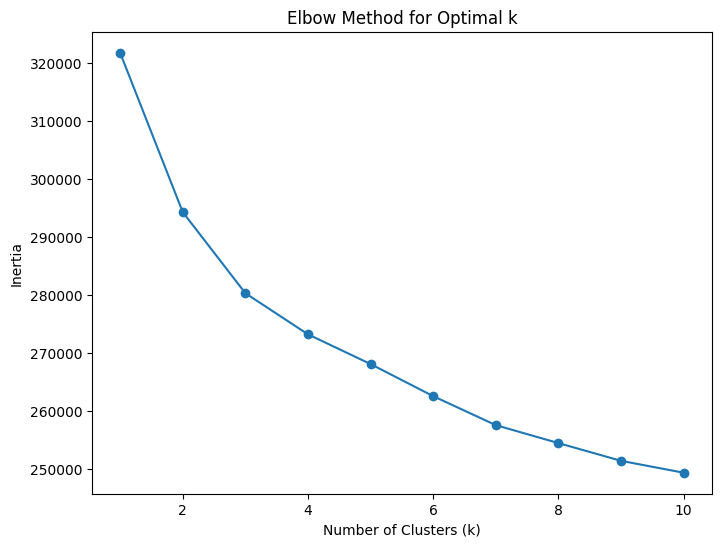

In [ ]:
## t-SNE Visualization (with K-means clustering)
np.random.seed(42)
random.seed(42)
tsne = TSNE(n_components=2, perplexity=100, random_state=42)
reduced_embeddings_tsne = tsne.fit_transform(embeddings_matrix)

# Elbow method to find optimal number of clusters
inertia = []
for i in range(1, 11):  # Check for clusters from 1 to 10
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(embeddings_matrix)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()


The elbow is not very clear. 3 or 7 clusters seem to be the most likely.

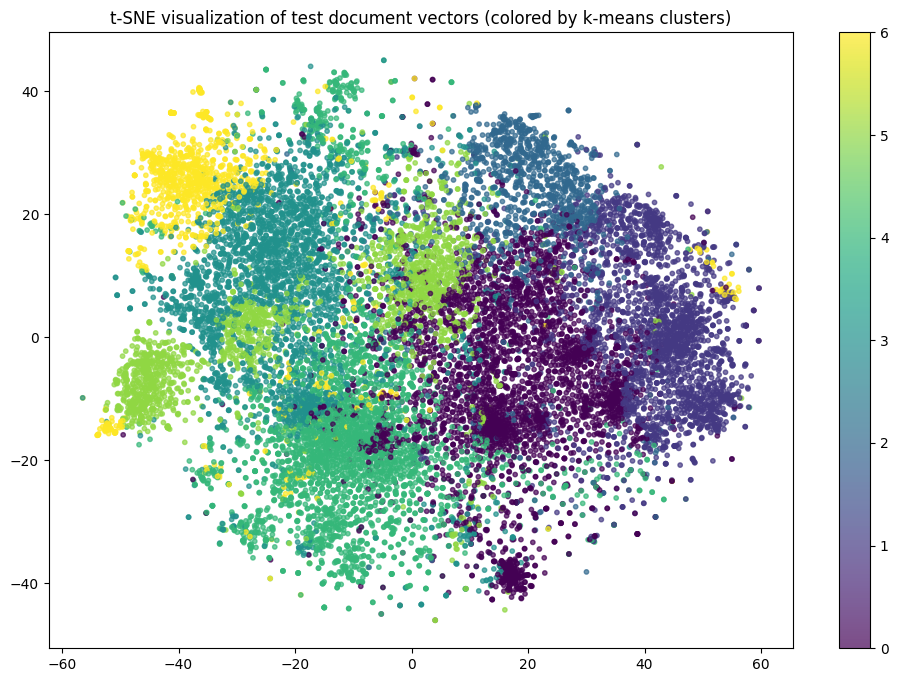

In [ ]:
# Perform k-means clustering
num_clusters = 7
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels_i = kmeans.fit_predict(embeddings_matrix)

# Scatter plot of the reduced vectors, colored by cluster labels
plt.figure(figsize=(12, 8))
plt.scatter(reduced_embeddings_tsne[:, 0], reduced_embeddings_tsne[:, 1], c=cluster_labels_i, s=10, alpha=0.7, cmap='viridis')
plt.title("t-SNE visualization of test document vectors (colored by k-means clusters)")
plt.colorbar() # color bar for better visibility of colors
plt.show()

In [ ]:
# Calculate clustering metrics
silhouette = silhouette_score(embeddings_matrix, cluster_labels_i)
print(f"Silhouette Score: {silhouette:.2f}")

Silhouette Score: 0.03


We do not see distinct clusters. It seems like the media articles form one big cluster and that the model is not really able to distinguish very distinct themes in the dataset.

The silhouette score is also very low (close to 0), confirming our interpretation.

Instead, we decide to fine-tune GloVe (using a Word2Vec format) to see if we can improve our results.

The Semantic Textual Similarity (STS) dataset contains pairs of sentences with similarity scores (0-5 scale), therefore providing ground truth that we can use to evaluate any of our models settings against. We therefore execute a grid search using the STS dataset to find the best settings to use for the model. The training data set was downloaded from here: https://github.com/ChristophAlt/embedding_vectorizer

In [ ]:
# Load the STS Benchmark dataset (we use the training one because it is slightly smaller than the original)
sts_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/sts-train.csv', delimiter='\t', header=None, names=['score', 'sentence1', 'sentence2'], on_bad_lines='skip')  # or on_bad_lines='warn'

# Tokenize the sentences for Doc2Vec
sts_data['tokens1'] = sts_data['sentence1'].apply(lambda x: word_tokenize(str(x).lower()) if pd.notna(x) else [])
sts_data['tokens2'] = sts_data['sentence2'].apply(lambda x: word_tokenize(str(x).lower()) if pd.notna(x) else [])

# Convert similarity scores to a scale of [0, 1]
sts_data['normalized_score'] = sts_data['score'] / 5.0

# Combine all tokens into a single corpus for training
all_tokens = sts_data['tokens1'].tolist() + sts_data['tokens2'].tolist()

# Hyperparameter grid
param_grid = {
    'vector_size': [400, 300],
    'window': [5, 10],
    'min_count': [1, 5]
}

# Function to compute sentence embeddings by averaging word vectors
def average_word_vectors(tokens, model):
    vectors = [model.wv[word] for word in tokens if word in model.wv]
    if vectors:  # Avoid empty list
        return np.mean(vectors, axis=0)
    return np.zeros(model.vector_size)

# Function to evaluate model on the STS dataset
def evaluate_model(model, sts_df):
    similarities = []
    for _, row in sts_df.iterrows():
        sent1_vec = average_word_vectors(row['tokens1'], model)
        sent2_vec = average_word_vectors(row['tokens2'], model)

        if sent1_vec is not None and sent2_vec is not None:
            similarity = cosine_similarity([sent1_vec], [sent2_vec])[0][0]
            similarities.append((similarity, row['normalized_score']))

    if similarities:
        pred_scores, human_scores = zip(*similarities)
        return spearmanr(pred_scores, human_scores).correlation
    return 0

# Grid search over hyperparameters
best_params = None
best_score = -np.inf

for params in product(*param_grid.values()):
    param_dict = dict(zip(param_grid.keys(), params))

    # Train Word2Vec model
    model = Word2Vec(
        sentences=all_tokens,
        vector_size=param_dict['vector_size'],
        window=param_dict['window'],
        min_count=param_dict['min_count']
    )

    # Evaluate the model
    score = evaluate_model(model, sts_data)
    print(f"Params: {param_dict}, Spearman Score: {score:.4f}")

    # Track the best hyperparameters
    if score > best_score:
        best_score = score
        best_params = param_dict

print(f"Best Parameters: {best_params}, Best Spearman Score: {best_score:.4f}")


Params: {'vector_size': 400, 'window': 5, 'min_count': 1}, Spearman Score: 0.1158
Params: {'vector_size': 400, 'window': 5, 'min_count': 5}, Spearman Score: 0.0914
Params: {'vector_size': 400, 'window': 10, 'min_count': 1}, Spearman Score: 0.1087
Params: {'vector_size': 400, 'window': 10, 'min_count': 5}, Spearman Score: 0.0797
Params: {'vector_size': 300, 'window': 5, 'min_count': 1}, Spearman Score: 0.1182
Params: {'vector_size': 300, 'window': 5, 'min_count': 5}, Spearman Score: 0.0940
Params: {'vector_size': 300, 'window': 10, 'min_count': 1}, Spearman Score: 0.1124
Params: {'vector_size': 300, 'window': 10, 'min_count': 5}, Spearman Score: 0.0857
Best Parameters: {'vector_size': 300, 'window': 5, 'min_count': 1}, Best Spearman Score: 0.1182


Now we train the model with the best parameters:

In [ ]:
# Load GloVe into Gensim
glove_file = '/content/glove/glove.6B.300d.txt'
word2vec_output_file = '/content/glove/word2vec.glove.6B.300d.txt'

# Convert GloVe format to Word2Vec format
glove2word2vec(glove_file, word2vec_output_file)

# Load the converted embeddings
glove_model = KeyedVectors.load_word2vec_format(word2vec_output_file, binary=False)

# Prepare your corpus
tokenized_sentences = [sentence.split() for sentence in media_train_sentence['clean_content']]
#tokenized_sentences = [sentence.split() for sentence in media_train_sentence['sentence_embeddings']]

# Initialize Word2Vec with GloVe embeddings
w2v_model = Word2Vec(vector_size=300, window=5, min_count=1, workers=4)
w2v_model.build_vocab(tokenized_sentences)  # Build vocab from your data
w2v_model.wv.vectors_lockf = np.ones(len(w2v_model.wv), dtype=np.float32)  # Set lockf=1 to allow fine-tuning
w2v_model.wv.intersect_word2vec_format(word2vec_output_file, binary=False, lockf=1.0)  # Initialize GloVe vectors

# Fine-tune the embeddings on your data
w2v_model.train(tokenized_sentences, total_examples=len(tokenized_sentences), epochs=5)

<ipython-input-10-bf36015aafef>:6: DeprecationWarning: Call to deprecated `glove2word2vec` (KeyedVectors.load_word2vec_format(.., binary=False, no_header=True) loads GLoVE text vectors.).
  glove2word2vec(glove_file, word2vec_output_file)


(47413537, 58853445)

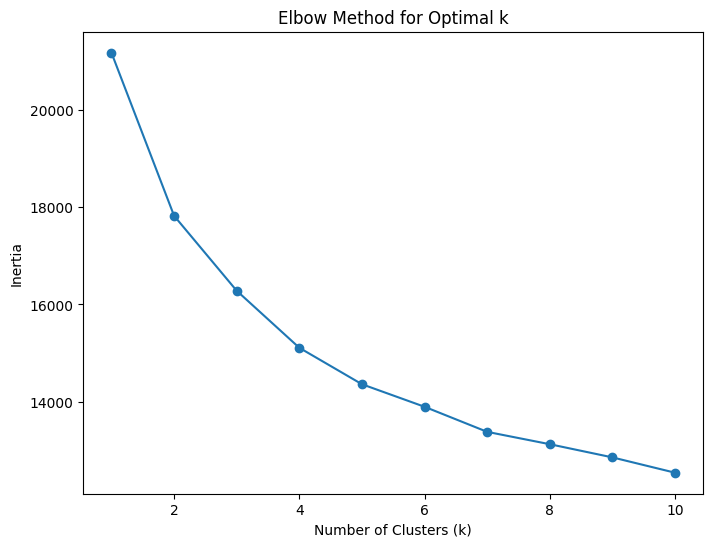

In [ ]:
## Visualization of the resulting embeddings from the test dataset:

np.random.seed(42)
random.seed(42)

def get_doc_embedding(text, model):
    """Get document embedding by averaging word vectors."""
    tokens = text.split()  # Tokenize the text
    vectors = [model.wv[word] for word in tokens if word in model.wv]
    if vectors:
        return np.mean(vectors, axis=0)
    return np.zeros(model.vector_size)  # Return zero vector if no valid words

# Generate document embeddings for test data
media_test_sentence['test_embeddings'] = media_test_sentence['clean_content'].apply(
    lambda x: get_doc_embedding(x, w2v_model)
)

# Create embeddings matrix for visualization
test_embeddings_matrix = np.vstack(media_test_sentence['test_embeddings'].values)

# Elbow method to find the optimal number of clusters
inertia = []
for i in range(1, 11):  # Check for clusters from 1 to 10
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(test_embeddings_matrix)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

Difficult to interpret. We set K = 7

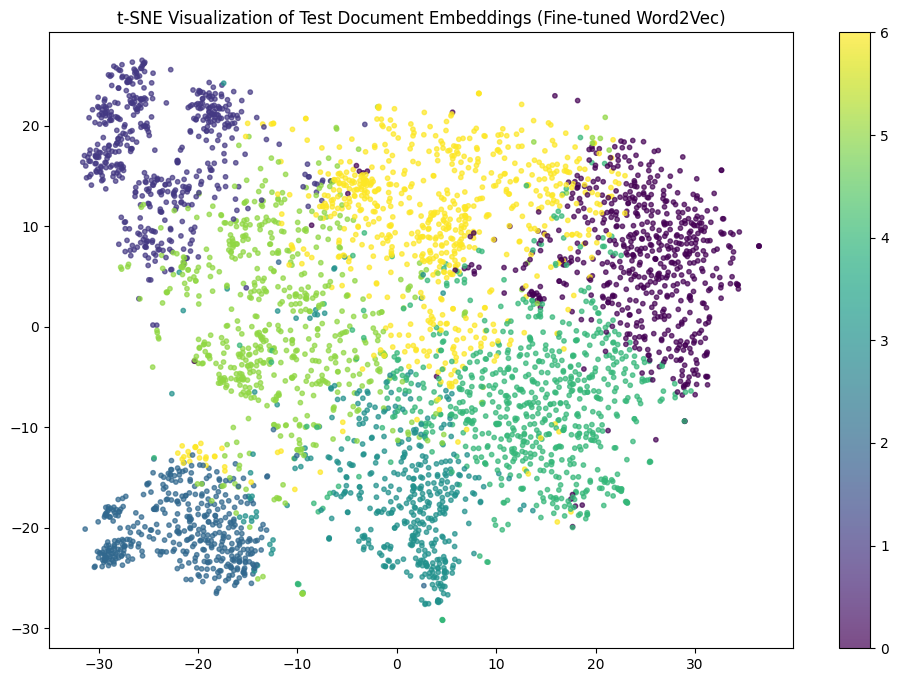

In [ ]:
np.random.seed(40)
random.seed(40)

# Apply KMeans clustering
num_clusters = 7
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(test_embeddings_matrix)

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, perplexity=100, random_state=42)
reduced_embeddings_tsne = tsne.fit_transform(test_embeddings_matrix)

# Visualize the results
plt.figure(figsize=(12, 8))
plt.scatter(
    reduced_embeddings_tsne[:, 0],
    reduced_embeddings_tsne[:, 1],
    c=cluster_labels,
    s=10,
    alpha=0.7,
    cmap='viridis',
)
plt.title("t-SNE Visualization of Test Document Embeddings (Fine-tuned Word2Vec)")
plt.colorbar()
plt.show()

The clustering looks much better now. There is still a lot of overlap and groups are not very well-separated even with high perplexity, but cluster 2 looks very distinct from the other clusters and cluster 6 looks like it has the most overlap across other datasets.

The silhouette score is very low, confirming our interpretation, but we notice that it is much better (0.10 vs 0.03) compared to what we had at the beginning:

In [ ]:
# Calculate clustering metrics
silhouette = silhouette_score(test_embeddings_matrix, cluster_labels)
print(f"Silhouette Score: {silhouette:.2f}")

Silhouette Score: 0.10


Let's see what clusters 2 and 6 contain:

In [ ]:
# Set the random seed
np.random.seed(42)

#select the sentences:
for cluster_id in [2,6]:
    print(f"Cluster {cluster_id}:")
    cluster_indices = np.where(cluster_labels == cluster_id)[0]  # Get indices of data points in this cluster

    # Select 2 random data points from the cluster
    selected_indices = np.random.choice(cluster_indices, size=min(2, len(cluster_indices)), replace=False)

    for index in selected_indices:
        sentence = media_test_sentence.iloc[index]['clean_content']
        title = media_test_sentence.iloc[index]['title']
        print(f"{title}: {sentence}")
    print("\n")

Cluster 2:
Global Tree Restoration and its Impact on Regional Water Availability: ["by clicking `` allow all '' you agree to the storing of cookies on your device to enhance site navigation, analyse site usage and support us in providing free open access scientific content. more info.", 'the united nations reported the decade on environmental restoration in june 2021 to prevent, slow, and reverse ecosystem degradation worldwide. large-scale tree restoration is critical for combating climate change, biodiversity enhancement, and ecosystem services protection. this article looks at a recent study published in nature geoscience, which details shifts in regional water availability caused by global tree restoration.', 'image credit: goncharukmaks/shutterstock.com', 'it is projected that an extra 900 million hectares of tree cover might exist on earth' s surface under current climate conditions without intruding on agriculture or metropolitan areas. several global and regional projects to en

- Cluster 2 seems to contain articles focused on sustainability goals and using technological advancements to reduce environmental impact.
- Cluster 6 seems to talk more about governmental support for renewable energies.

#### 3.2.2.Patent Dataset

We do the same for the patent dataset.

The media and patent train datasets are of comparable sizes, so the fine-tuning should be similarly effective:

In [ ]:
print(f"media dataset size: {media_train_sentence.size}")
print(f"patent dataset size: {patent_train_sentence.size}")

media dataset size: 112602
patent dataset size: 184832


Model training:

In [ ]:
# Load GloVe into Gensim
glove_file = '/content/glove/glove.6B.300d.txt'
word2vec_output_file = '/content/glove/word2vec.glove.6B.300d.txt'

# Convert GloVe format to Word2Vec format
glove2word2vec(glove_file, word2vec_output_file)

# Load the converted embeddings
glove_model = KeyedVectors.load_word2vec_format(word2vec_output_file, binary=False)

# Prepare your corpus
tokenized_sentences_patent = [sentence.split() for sentence in patent_train_sentence['clean_abstract']]

# Initialize Word2Vec with GloVe embeddings
w2v_model_patent = Word2Vec(vector_size=300, window=5, min_count=1, workers=4)
w2v_model_patent.build_vocab(tokenized_sentences_patent)  # Build vocab from your data
w2v_model_patent.wv.vectors_lockf = np.ones(len(w2v_model_patent.wv), dtype=np.float32)  # Set lockf=1 to allow fine-tuning
w2v_model_patent.wv.intersect_word2vec_format(word2vec_output_file, binary=False, lockf=1.0)  # Initialize GloVe vectors

# Fine-tune the embeddings on your data
w2v_model_patent.train(tokenized_sentences_patent, total_examples=len(tokenized_sentences_patent), epochs=5)

<ipython-input-65-c1e890324dd0>:6: DeprecationWarning: Call to deprecated `glove2word2vec` (KeyedVectors.load_word2vec_format(.., binary=False, no_header=True) loads GLoVE text vectors.).
  glove2word2vec(glove_file, word2vec_output_file)


(14991976, 21341810)

Visualization:

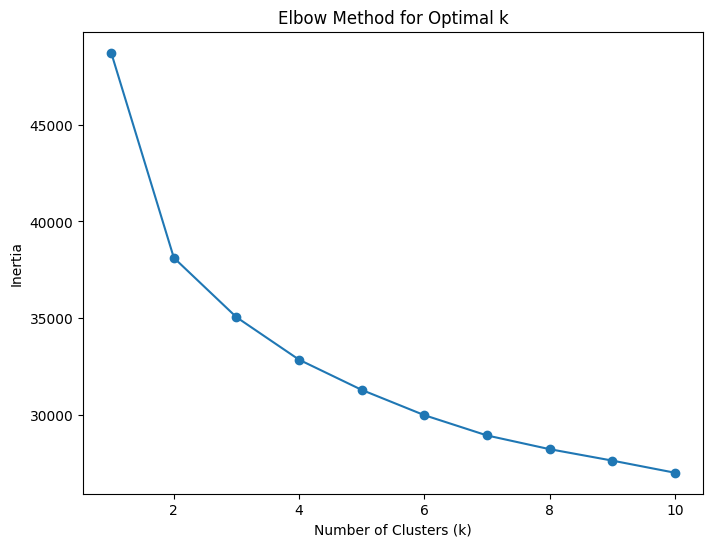

In [ ]:
## Visualization of the resulting embeddings from the test dataset:

np.random.seed(42)
random.seed(42)

def get_doc_embedding(text, model):
    """Get document embedding by averaging word vectors."""
    tokens = text.split()  # Tokenize the text
    vectors = [model.wv[word] for word in tokens if word in model.wv]
    if vectors:
        return np.mean(vectors, axis=0)
    return np.zeros(model.vector_size)  # Return zero vector if no valid words

# Generate document embeddings for test data
patent_test_sentence['test_embeddings'] = patent_test_sentence['clean_abstract'].apply(
    lambda x: get_doc_embedding(x, w2v_model_patent)
)

# Create embeddings matrix for visualization
test_embeddings_matrix_patent = np.vstack(patent_test_sentence['test_embeddings'].values)

# Elbow method to find the optimal number of clusters
inertia = []
for i in range(1, 11):  # Check for clusters from 1 to 10
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(test_embeddings_matrix_patent)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

We set k = 3

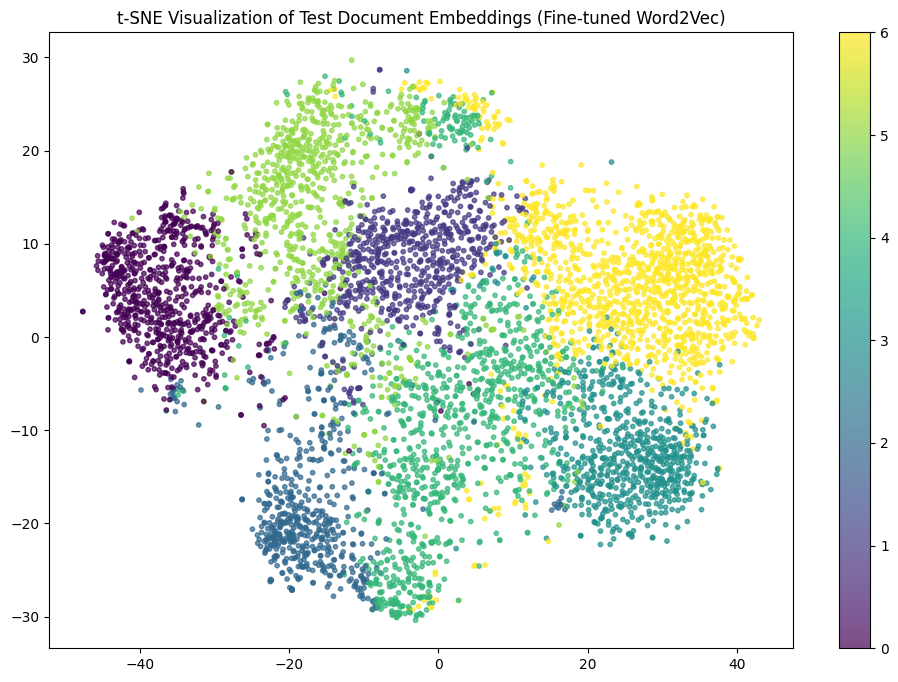

In [ ]:
np.random.seed(40)
random.seed(40)

# Apply KMeans clustering
num_clusters_patent = 7
kmeans = KMeans(n_clusters=num_clusters_patent, random_state=42)
cluster_labels_patent = kmeans.fit_predict(test_embeddings_matrix_patent)

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, perplexity=100, random_state=42)
reduced_embeddings_tsne = tsne.fit_transform(test_embeddings_matrix_patent)

# Visualize the results
plt.figure(figsize=(12, 8))
plt.scatter(
    reduced_embeddings_tsne[:, 0],
    reduced_embeddings_tsne[:, 1],
    c=cluster_labels_patent,
    s=10,
    alpha=0.7,
    cmap='viridis',
)
plt.title("t-SNE Visualization of Test Document Embeddings (Fine-tuned Word2Vec)")
plt.colorbar()
plt.show()

The silhouette score is still quite low and the clusters are overlaping :

In [ ]:
# Calculate clustering metrics
silhouette = silhouette_score(test_embeddings_matrix_patent, cluster_labels_patent)
print(f"Silhouette Score: {silhouette:.2f}")

Silhouette Score: 0.11


In [ ]:
# Set the random seed
np.random.seed(42)

#select the sentences:
for cluster_id in [0]:
    print(f"Cluster {cluster_id}:")
    cluster_indices = np.where(cluster_labels_patent == cluster_id)[0]  # Get indices of data points in this cluster

    # Select 4 random data points from the cluster
    selected_indices = np.random.choice(cluster_indices, size=min(4, len(cluster_indices)), replace=False)

    for index in selected_indices:
        sentence = patent_test_sentence.iloc[index]['clean_abstract']
        title = patent_test_sentence.iloc[index]['title']
        print(f"{title}: {sentence}")
    print("\n")

Cluster 0:
Equipment-oriented industrial data classification and query method: the equipment-oriented industrial data classification and query method comprises the following steps: constructing a logic hierarchical structure of hydroelectric equipment; constructing a basic information dictionary of hydroelectric equipment; importing hydroelectric equipment data into an equipment classification value dictionary: importing existing or already coded hydropower equipment data, wherein the hydropower equipment data needs to comprise complete kks codes, equipment logic paths, types, manufacturers and model attribute information; defining a panoramic model of the hydroelectric equipment: defining one or more hydropower equipment panoramic models, wherein the hydropower equipment panoramic models comprise model data information related to equipment and relations among resource types; classifying data of the panoramic model of the hydroelectric equipment; and viewing the panoramic data of the e

Cluster 0 seems to display themes of hydraulic power generation but also integration of multiple power sources. The patents also seem to emphasize the use of advanced algorithms to optimize energy generation.

#### 3.2.3. Media and Patent Datasets

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


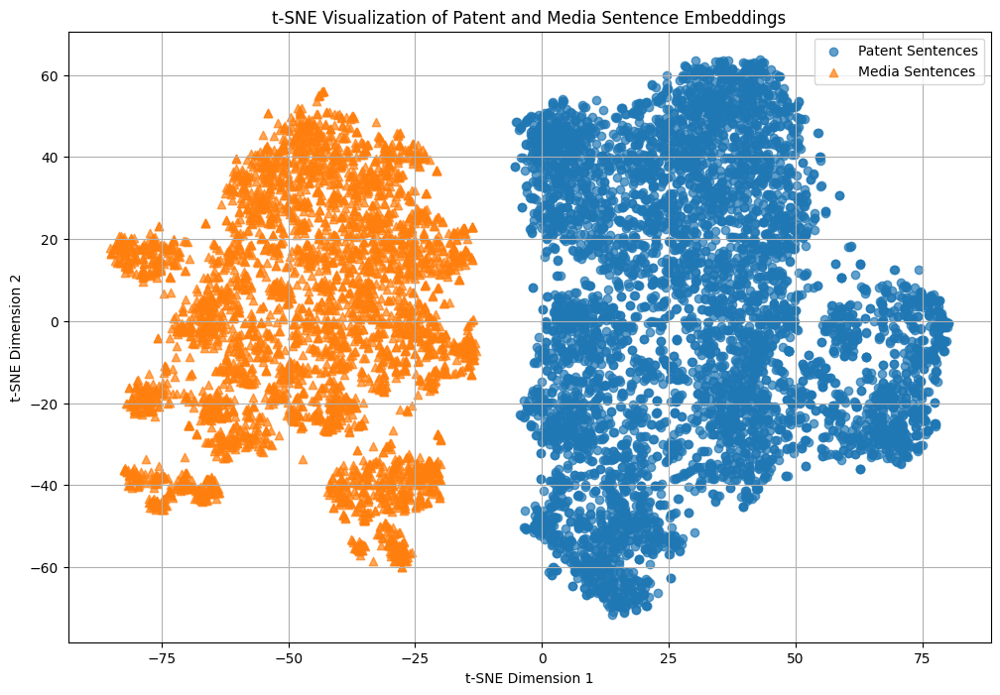

In [ ]:
# set random seeds:
random.seed(42)  # Set a seed for Python's random module
np.random.seed(42)  # Set a seed for NumPy's random functions

# combine vectors for visualization:
combined_sentence_embeddings = np.concatenate((test_embeddings_matrix_patent , test_embeddings_matrix ), axis=0)

# Perform t-SNE for dimensionality reduction to 2D
tsne_sentence = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_sent_results = tsne_sentence.fit_transform(combined_sentence_embeddings)

# Split back into patent and media vectors
n = len(test_embeddings_matrix_patent)
tsne_patent_sentences = tsne_sent_results[:n]
tsne_media_sentences = tsne_sent_results[n:]

plt.figure(figsize=(12, 8))
plt.scatter(tsne_patent_sentences[:, 0], tsne_patent_sentences[:, 1], label='Patent Sentences', alpha=0.7, marker='o')
plt.scatter(tsne_media_sentences[:, 0], tsne_media_sentences[:, 1], label='Media Sentences', alpha=0.7, marker='^')
plt.legend()
plt.title("t-SNE Visualization of Patent and Media Sentence Embeddings")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid()
plt.show()

Here the media and patent datasets appear to be very distinct from each other and there is no overlap.

### 3.3. Doc2Vec Sentence Embeddings




Doc2Vec assigns a unique vector to each document or sentence and trains the model to predict words in that context. It captures semantics that are useful for various NLP tasks like document retrieval and text classification.

Doc2vec is almost similar to word2vec but unlike words, a logical structure is not maintained in documents, so while developing doc2vec another vector named Paragraph ID is added into it.

In this case, this will allow us to examine thematic overalps and differences within and between the media and patent data sets.

#### 3.3.1. Media dataset

First, we tokenize the sentences:

In [ ]:
# media data sets:
tokenized_sent_media_train = []
for s in media_train_sentence["clean_content"]:
    tokenized_sent_media_train.append(word_tokenize(s.lower()))

tokenized_sent_media_test = []
for s in media_test_sentence["clean_content"]:
    tokenized_sent_media_test.append(word_tokenize(s.lower()))

# patent data sets:
tokenized_sent_patent_train = []
for s in patent_train_sentence["clean_abstract"]:
  tokenized_sent_patent_train.append(word_tokenize(s.lower()))

tokenized_sent_patent_test = []
for s in patent_test_sentence["clean_abstract"]:
  tokenized_sent_patent_test.append(word_tokenize(s.lower()))

In [ ]:
#We create tagged documents that Doc2Vec expects as input:
tagged_data_media_train = [TaggedDocument(d, [i]) for i, d in enumerate(tokenized_sent_media_train)]
tagged_data_media_test = [TaggedDocument(d, [i]) for i, d in enumerate(tokenized_sent_media_test)]
tagged_data_patent_train = [TaggedDocument(d, [i]) for i, d in enumerate(tokenized_sent_patent_train)]
tagged_data_patent_test = [TaggedDocument(d, [i]) for i, d in enumerate(tokenized_sent_patent_test)]

The Semantic Textual Similarity (STS) dataset contains pairs of sentences with similarity scores (0-5 scale), therefore providing ground truth that we can use to evaluate any of our models settings against. We therefore execute a grid search using the STS dataset to find the best settings to use for Doc2Vec. The training data set was downloaded from here: https://github.com/ChristophAlt/embedding_vectorizer

Note that we use PVDM : we assign a paragraph vector sentence while sharing word vectors among all sentences. DM architecture considers both the word order and document context, making it more powerful for capturing the semantic meaning of documents

In [ ]:
## Grid Search using the STS Benchmark dataset

# Load the STS Benchmark dataset (we use the training one because it is slightly smaller than the original)
train_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/sts-train.csv', delimiter='\t', header=None, names=['score', 'sentence1', 'sentence2'], on_bad_lines='skip')  # or on_bad_lines='warn'

# Tokenize the sentences for Doc2Vec
train_data['tokens1'] = train_data['sentence1'].apply(lambda x: word_tokenize(str(x).lower()) if pd.notna(x) else [])
train_data['tokens2'] = train_data['sentence2'].apply(lambda x: word_tokenize(str(x).lower()) if pd.notna(x) else [])

# Convert similarity scores to a scale of [0, 1]
train_data['normalized_score'] = train_data['score'] / 5.0

# Create TaggedDocument objects for sentences
tagged_docs = [
    TaggedDocument(words=row['tokens1'], tags=[f'sent1_{i}']) for i, row in train_data.iterrows()
] + [
    TaggedDocument(words=row['tokens2'], tags=[f'sent2_{i}']) for i, row in train_data.iterrows()
]

# Hyperparameter grid
feature_sizes = [100, 150]
window_sizes = [5, 7]
min_word_counts = [3, 10]
epochs_list= [10, 30]

# Store the best model and its evaluation score
best_score = -np.inf
best_params = None
best_model = None

# Loop over hyperparameters
for feature_size in feature_sizes:
    for window_size in window_sizes:
        for min_word_count in min_word_counts:
          for epochs in epochs_list:

            # Train the model with the current set of hyperparameters
            doc2vec_model = Doc2Vec(
                vector_size=feature_size,
                window=window_size,
                min_count=min_word_count,
                dm=1,  # Use Distributed Memory (dm=1)
                epochs=epochs
            )
            doc2vec_model.build_vocab(tagged_docs)
            doc2vec_model.train(tagged_docs, total_examples=doc2vec_model.corpus_count, epochs=doc2vec_model.epochs)

            # Evaluate the model: Document similarity
            similarity_scores = []  # Store predicted similarities
            ground_truth_scores = []  # Store normalized scores

            # Reset index to ensure it starts from 0
            train_data = train_data.reset_index(drop=True)  # drop=True removes the old index

            for i in range(len(train_data)):
                doc1_vec = doc2vec_model.infer_vector(train_data.loc[i, 'tokens1'])
                doc2_vec = doc2vec_model.infer_vector(train_data.loc[i, 'tokens2'])

                # Calculate cosine similarity between document vectors
                similarity = cosine_similarity([doc1_vec], [doc2_vec])[0][0]

                similarity_scores.append(similarity)
                ground_truth_scores.append(train_data.loc[i, 'normalized_score'])

            # Calculate correlation between predicted and ground truth scores (e.g., Pearson correlation)
            correlation = np.corrcoef(similarity_scores, ground_truth_scores)[0, 1]

            # If the current model performs better, save it
            if correlation > best_score:
                best_score = correlation
                best_params = (feature_size, window_size, min_word_count, epochs)  # Include epochs
                best_model = doc2vec_model

# Print the best hyperparameters
print(f"Best Hyperparameters: feature_size={best_params[0]}, window_size={best_params[1]}, min_word_count={best_params[2]}, epochs={best_params[3]}")

Best Hyperparameters: feature_size=100, window_size=5, min_word_count=3, epochs=30


In [ ]:
doc2vec_media_model_dm = Doc2Vec(dm=1, vector_size=100, min_count=3, window=5, epochs=30)
doc2vec_media_model_dm.build_vocab(tagged_data_media_train)

In [ ]:
# Check vocabulary size
doc2vec_media_model_dm.corpus_total_words

13602532

In [ ]:
# Training for 30 epochs
%time
doc2vec_media_model_dm.train(tagged_data_media_train, total_examples=doc2vec_media_model_dm.corpus_count, epochs=30)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.44 µs


In [ ]:
# Save the model
model_save_path = '/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/doc2vec_media_model_dm.model'  # Choose your desired path
doc2vec_media_model_dm.save(model_save_path)

In [ ]:
# Here we test our model by finding the document with the highest similarity score to our first document:
similar_doc = doc2vec_media_model_dm.dv.most_similar(0)
print(similar_doc[0])

(15169, 0.5824568867683411)


In [ ]:
#print the two documents:
print(media_train_sentence.iloc[0]['clean_content'])
print(media_train_sentence.iloc[15169]['clean_content'])

['climate activists won a court case in norway against the state over development plans at a handful of oil and gas fields under the north sea off the nordic country' s coast.', 'greenpeace norway and young friends of the earth argued that development plans at the breidablikk, tyrving and yggdrasil fields, approved by the ministry of energy in 2021 and 2023, are invalid. on thursday, the oslo district court concluded that the impact of combustion emissions must be considered by law, and that no impact assessment of such emissions had been carried out in connection with the decisions in question, it said.', 'the ruling is a breakthrough for environmental groups. in an earlier case, the same two organizations, along with six young climate activists, had argued that allowing oil exploration in the arctic during a climate crisis breaches fundamental human rights. after failing to persuade the supreme court in that case and after a series of appeals, the groups submitted their case to the e

The model seems to be somewhat effective in capturing similar contexts, here between an article depicting protests in Norway against the government's plans to develop new oil and gas fields off the coast and another talking about Norwegian's relations to renewable energies.

We also try a more straightforward model, with PV-DBOW (dm=0), which means that the word-vectors aren't trained and remain random:

In [ ]:
## Grid search with PV-DBOW model

# Hyperparameter grid
feature_sizes = [100, 150]
window_sizes = [5, 7]
min_word_counts = [3, 10]
epochs_list= [10, 30]

# Store the best model and its evaluation score
best_score = -np.inf
best_params = None
best_model = None

# Loop over hyperparameters
for feature_size in feature_sizes:
    for window_size in window_sizes:
        for min_word_count in min_word_counts:
          for epochs in epochs_list:

            # Train the model with the current set of hyperparameters
            doc2vec_model = Doc2Vec(
                vector_size=feature_size,
                window=window_size,
                min_count=min_word_count,
                dm=0, # PV-DBOW
                epochs=epochs
            )
            doc2vec_model.build_vocab(tagged_docs)
            doc2vec_model.train(tagged_docs, total_examples=doc2vec_model.corpus_count, epochs=doc2vec_model.epochs)

            # Evaluate the model: Document similarity
            similarity_scores = []  # Store predicted similarities
            ground_truth_scores = []  # Store normalized scores

            # Reset index to ensure it starts from 0
            train_data = train_data.reset_index(drop=True)  # drop=True removes the old index

            for i in range(len(train_data)):
                doc1_vec = doc2vec_model.infer_vector(train_data.loc[i, 'tokens1'])
                doc2_vec = doc2vec_model.infer_vector(train_data.loc[i, 'tokens2'])

                # Calculate cosine similarity between document vectors
                similarity = cosine_similarity([doc1_vec], [doc2_vec])[0][0]

                similarity_scores.append(similarity)
                ground_truth_scores.append(train_data.loc[i, 'normalized_score'])

            # Calculate correlation between predicted and ground truth scores (e.g., Pearson correlation)
            correlation = np.corrcoef(similarity_scores, ground_truth_scores)[0, 1]

            # If the current model performs better, save it
            if correlation > best_score:
                best_score = correlation
                best_params = (feature_size, window_size, min_word_count, epochs)  # Include epochs
                best_model = doc2vec_model

# Print the best hyperparameters
print(f"Best Hyperparameters: feature_size={best_params[0]}, window_size={best_params[1]}, min_word_count={best_params[2]}, epochs={best_params[3]}")

Best Hyperparameters: feature_size=100, window_size=7, min_word_count=10, epochs=30


In [ ]:
doc2vec_media_model = Doc2Vec(dm=0, vector_size=100, min_count=10, window=7, sample = 0, epochs=30)

In [ ]:
doc2vec_media_model.build_vocab(tagged_data_media_train)

In [ ]:
# Check vocabulary size
doc2vec_media_model.corpus_total_words

13602532

In [ ]:
# Training for 30 epochs
%time
doc2vec_media_model.train(tagged_data_media_train, total_examples=doc2vec_media_model.corpus_count, epochs=30)

CPU times: user 0 ns, sys: 4 µs, total: 4 µs
Wall time: 7.87 µs


In [ ]:
# Save the model
model_save_path = '/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/doc2vec_media_model.model'  # Choose your desired path
doc2vec_media_model.save(model_save_path)

In [ ]:
# Here we test our model by finding the document with the highest similarity score to our first document:
similar_doc = doc2vec_media_model.dv.most_similar(0)
print(similar_doc[0])

(11293, 0.5709083080291748)


In [ ]:
#print the two documents:
print(media_train_sentence.iloc[0]['clean_content'])
print(media_train_sentence.iloc[11293]['clean_content'])

['climate activists won a court case in norway against the state over development plans at a handful of oil and gas fields under the north sea off the nordic country' s coast.', 'greenpeace norway and young friends of the earth argued that development plans at the breidablikk, tyrving and yggdrasil fields, approved by the ministry of energy in 2021 and 2023, are invalid. on thursday, the oslo district court concluded that the impact of combustion emissions must be considered by law, and that no impact assessment of such emissions had been carried out in connection with the decisions in question, it said.', 'the ruling is a breakthrough for environmental groups. in an earlier case, the same two organizations, along with six young climate activists, had argued that allowing oil exploration in the arctic during a climate crisis breaches fundamental human rights. after failing to persuade the supreme court in that case and after a series of appeals, the groups submitted their case to the e

This model seems to be somewhat effective in capturing similar contexts, here between an article depicting protests in Norway against the government's plans to develop new oil and gas fields off the coast and another talking about how Biden suspended new gas and oil land leasings.

We had previously used the Semantic Textual Similarity (STS) dataset to execute a grid search to find the best settings for our Doc2Vec model. We will now use it to evaluate the model we trained:

In [ ]:
## Evaluate the first model (using PVDM)

# Load the STS Benchmark dataset (we use the training one because it is slightly smaller than the original)
sts_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/sts-train.csv', delimiter='\t', header=None, names=['score', 'sentence1', 'sentence2'], on_bad_lines='skip')  # or on_bad_lines='warn'

# Tokenize the sentences for Doc2Vec
sts_data['tokens1'] = sts_data['sentence1'].apply(lambda x: word_tokenize(str(x).lower()) if pd.notna(x) else [])
sts_data['tokens2'] = sts_data['sentence2'].apply(lambda x: word_tokenize(str(x).lower()) if pd.notna(x) else [])

# Convert similarity scores to a scale of [0, 1]
sts_data['normalized_score'] = sts_data['score'] / 5.0

# Create TaggedDocument objects for sentences
tagged_docs = [
    TaggedDocument(words=row['tokens1'], tags=[f'sent1_{i}']) for i, row in sts_data.iterrows()
] + [
    TaggedDocument(words=row['tokens2'], tags=[f'sent2_{i}']) for i, row in sts_data.iterrows()
]


def evaluate_sentence_model (model):
  """this function evaluates the model using the STS dataset and pearson correlations"""

  # Infer embeddings for sentence pairs
  sentence1_embeddings = [model.infer_vector(tokens) for tokens in sts_data['tokens1']]
  sentence2_embeddings = [model.infer_vector(tokens) for tokens in sts_data['tokens2']]

  # Calculate cosine similarities
  similarities = [cosine_similarity([emb1], [emb2])[0][0] for emb1, emb2 in zip(sentence1_embeddings, sentence2_embeddings)]

  # Calculate Pearson correlation with ground truth
  correlation = np.corrcoef(similarities, sts_data['normalized_score'])[0, 1]

  return correlation

evaluation = evaluate_sentence_model(doc2vec_media_model_dm)
evaluation


0.4291943671421664

In [ ]:
## Evaluate the second model (using PV-DBOW)

evaluation = evaluate_sentence_model(doc2vec_media_model)
evaluation

0.5775949815452373

Based on the above, the PV-DBOW Doc2Vec model seems to be better performing on the basis of our benchmark. We now build a visualization with the test data:

In [ ]:
## Define the test vectors
random.seed(42)
test_vectors = [doc2vec_media_model.infer_vector(doc.words) for doc in tagged_data_media_test]
test_vectors = np.array(test_vectors) # Convert the list of arrays to a 2D NumPy array

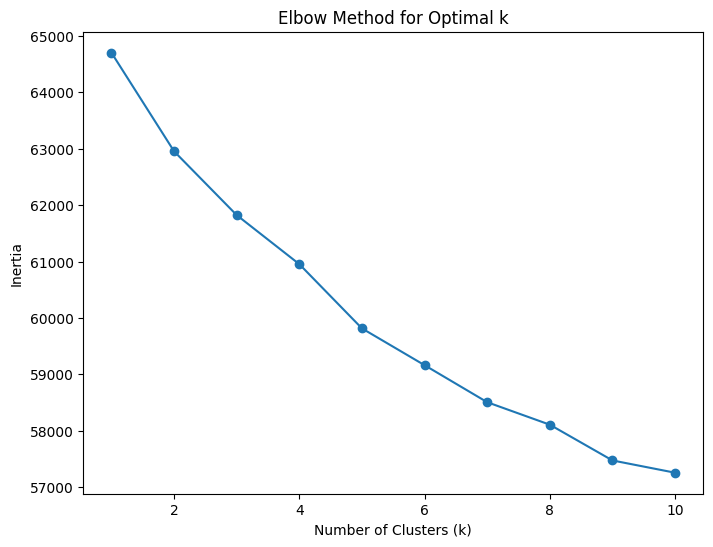

In [ ]:
## t-SNE visualization of the Doc2Vec data (PV-DBOW):

# Reduce the dimensionality of test vectors for visualization
tsne = TSNE(n_components=2, random_state=42)
reduced_vectors = tsne.fit_transform(test_vectors)

# Elbow method to find optimal number of clusters
inertia = []
for i in range(1, 11):  # Check for clusters from 1 to 10
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(test_vectors)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()


the optimal number of clusters may be around 7 or perhaps 9.

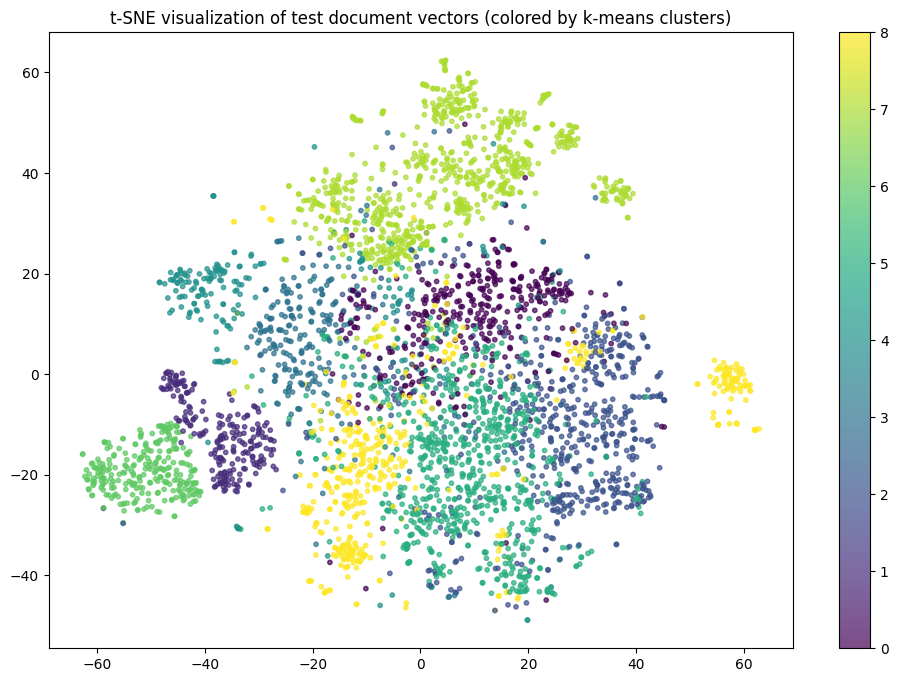

In [ ]:
# Perform k-means clustering
num_clusters = 9
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(test_vectors)

# Scatter plot of the reduced vectors, colored by cluster labels
plt.figure(figsize=(12, 8))
plt.scatter(reduced_vectors[:, 0], reduced_vectors[:, 1], c=cluster_labels, s=10, alpha=0.7, cmap='viridis')
plt.title("t-SNE visualization of test document vectors (colored by k-means clusters)")
plt.colorbar() # color bar for better visibility of colors
plt.show()

In [ ]:
# Calculate clustering metrics
silhouette = silhouette_score(test_vectors, cluster_labels)
print(f"Silhouette Score: {silhouette:.2f}")

Silhouette Score: 0.01


It seems like there is quite a lot of overlap between most clusters as we can see visually. The silhouette score confirms our impression since it is around 0.

We do however find a few distinct clusters in the visualization. They appear to be much more distinct when compared to our results when we tried averaging word embeddings.

We examine the contents of clusters:

In [ ]:
# Set the random seed
np.random.seed(42)

#select the sentences:
for cluster_id in range(num_clusters):
    print(f"Cluster {cluster_id}:")
    cluster_indices = np.where(cluster_labels == cluster_id)[0]  # Get indices of data points in this cluster

    # Select 4 random data points from the cluster
    selected_indices = np.random.choice(cluster_indices, size=min(4, len(cluster_indices)), replace=False)

    for index in selected_indices:
        sentence = media_test_sentence.iloc[index]['clean_content']
        title = media_test_sentence.iloc[index]['title']
        print(f"{title}: {sentence}")
    print("\n")

Cluster 0:
Montana – pv magazine International: ['a chinese research group has sought to understand the relative performance of two weather prediction techniques based on ensemble modeling for solar energy forecasts. the scientists applied the two methods in combination with three classical post-processing methods.', 'the norwegian company mothballed its washington state facility more than a year ago and is now reliant on semiconductor-grade poly and silane gas produced at its fab in butte, montana - a facility for which the business says it has received plenty of interest from potential purchasers.', 'finnish lender nordea has called in a nok150 million indemnity loan thought to have been taken out by rec silicon asa as a result of the bankruptcy of its norwegian wafer manufacturing arm seven years ago.', 'the norwegian polysilicon and silane gas producer has announced it will listen to offers for its production facility in butte montana after mothballing its other manufacturing opera

We can see at a glance that :

- cluster 0 seems to closely relate to solar energy
- cluster 2 seems more closely related to solar energy massive investments
- cluster 6 appears to be one of the more distinct clusters and concerns bioenergy
- cluster 7 is aslo quite distinct and appears to have many mentions of cities' power grids and how they can benefit from renewable energies.

#### 3.3.2. Patent Dataset

We proceed the same as for the media data set. We already found the best Doc2Vec models based on our benchmark, so now we have to apply them to this dataset and evaluate them once again.

In [ ]:
## PV-DBOW Doc2Vec model

# Prepare the model
doc2vec_patent_model = Doc2Vec(dm=0, vector_size=100, min_count=10, window=7, sample = 0, epochs=30)
doc2vec_patent_model.build_vocab(tagged_data_patent_train)

# Training for 30 epochs
doc2vec_patent_model.train(tagged_data_patent_train, total_examples=doc2vec_patent_model.corpus_count, epochs=30)

In [ ]:
# Check vocabulary size
doc2vec_patent_model.corpus_total_words

4665669

In [ ]:
## PV-DM Doc2Vec model

# Prepare the model
doc2vec_patent_model_dm = Doc2Vec(dm=1, vector_size=100, min_count=3, window=5, epochs=30)
doc2vec_patent_model_dm.build_vocab(tagged_data_patent_train)

# Training for 30 epochs
doc2vec_patent_model_dm.train(tagged_data_patent_train, total_examples=doc2vec_patent_model_dm.corpus_count, epochs=30)

In [ ]:
# Check vocabulary size
doc2vec_patent_model_dm.corpus_total_words

4665669

In [ ]:
## Save the models
model_save_path = '/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/doc2vec_patent_model.model'
doc2vec_patent_model.save(model_save_path)
model_save_path = '/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/doc2vec_patent_model_dm.model'
doc2vec_patent_model_dm.save(model_save_path)

In [ ]:
## Evaluate the models
evaluation1 = evaluate_sentence_model(doc2vec_patent_model)
evaluation2 = evaluate_sentence_model(doc2vec_patent_model_dm)
print(f"PV-DBOW model evaluation: {evaluation1}")
print(f"PV-DM model evaluation: {evaluation2}")

PV-DBOW model evaluation: 0.3725233096847587
PV-DM model evaluation: 0.37597946125576426


Both models seem to perform similarily. We pick the PV-DM one, which performs slightly better.

In [ ]:
## Define test vectors
random.seed(42) # set seed for reproductibility
test_vectors_patent = [doc2vec_patent_model_dm.infer_vector(doc.words) for doc in tagged_data_patent_test]
test_vectors_patent = np.array(test_vectors_patent) # Convert the list of arrays to a 2D NumPy array

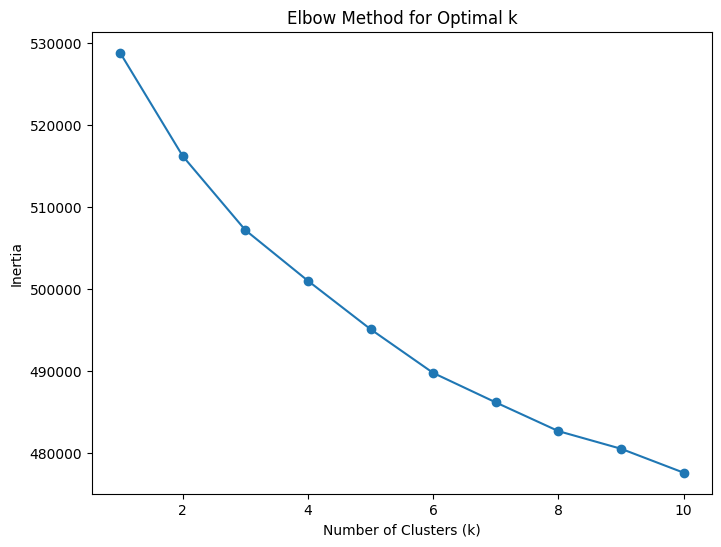

In [ ]:
## t-SNE visualization of the Doc2Vec data (PV-DM):

# Reduce the dimensionality of test vectors for visualization
tsne = TSNE(n_components=2, random_state=42)
reduced_vectors = tsne.fit_transform(test_vectors_patent)

# Elbow method to find optimal number of clusters
inertia = []
for i in range(1, 11):  # Check for clusters from 1 to 10
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(test_vectors_patent)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()


The amount of clusters is very difficult to determine. We choose 10 clusters as a default.

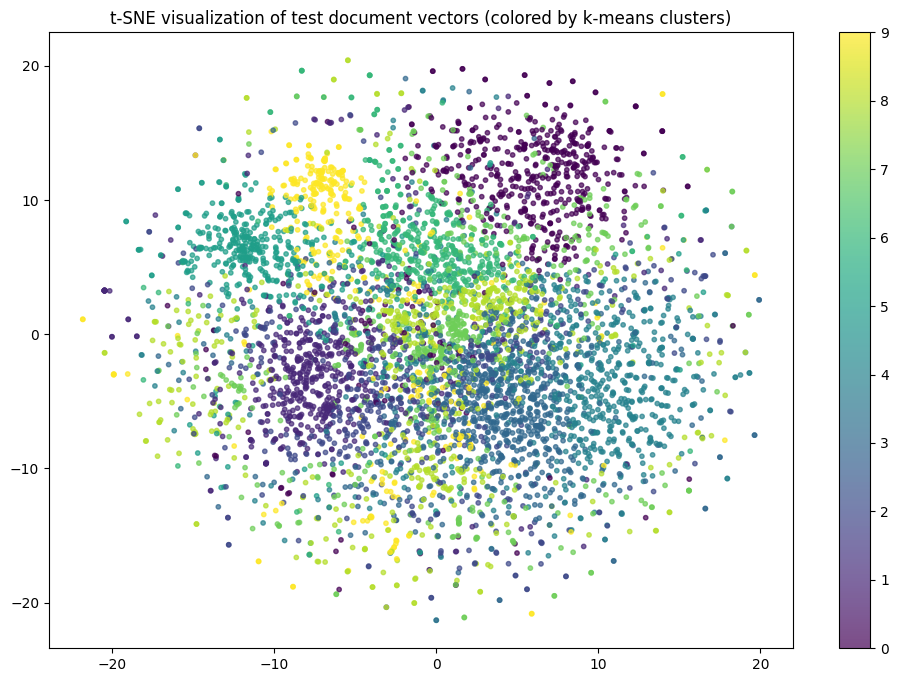

In [ ]:
# Perform k-means clustering
num_clusters = 10
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(test_vectors_patent)

# Scatter plot of the reduced vectors, colored by cluster labels
plt.figure(figsize=(12, 8))
plt.scatter(reduced_vectors[:, 0], reduced_vectors[:, 1], c=cluster_labels, s=10, alpha=0.7, cmap='viridis')
plt.title("t-SNE visualization of test document vectors (colored by k-means clusters)")
plt.colorbar() # color bar for better visibility of colors
plt.show()

In [ ]:
# Calculate clustering metrics
silhouette = silhouette_score(test_vectors_patent, cluster_labels)
print(f"Silhouette Score: {silhouette:.2f}")

Silhouette Score: 0.02


It does not appear that clustering was very successful. However, let's examine the K-means clusters closer:

In [ ]:
# Set the random seed
np.random.seed(42)

# select the sentences:
for cluster_id in range(num_clusters):
    print(f"Cluster {cluster_id}:")
    cluster_indices = np.where(cluster_labels == cluster_id)[0]  # Get indices of data points in this cluster

    # Select 4 random data points from the cluster
    selected_indices = np.random.choice(cluster_indices, size=min(4, len(cluster_indices)), replace=False)

    for index in selected_indices:
        sentence = patent_test_sentence.iloc[index]['clean_abstract']
        title = patent_test_sentence.iloc[index]['title']
        print(f"{title}: {sentence}")
    print("\n")

Cluster 0:
一种快速辨识水轮机组转动部件轴心轨迹的方法: the invention discloses a method for rapidly identifying the axle center track of a rotating part of a hydraulic turbine set, which comprises the steps of obtaining a section of original vibration signal sampling sequence of the rotating part of the hydraulic turbine set, selecting a proper wavelet basis function, carrying out wavelet resolution structural processing through high-low pass filtering and binary down-sampling processing, processing analytic data of a certain layer or a plurality of layers of depths according to a specific threshold algorithm, reducing a reconstruction data signal to obtain a reconstruction sequence as an axle center track graph, wherein the reconstruction sequence is used for monitoring the real condition of the axle center track of the rotating part of the hydraulic turbine set, rapidly identifying the running state of the hydraulic turbine set of a large and medium-sized hydropower station, and is beneficial to improvin

Clusters 7and 9 seem to be the most distinct in the k-means clustering groups.

- cluster 7: concerns solar energy and materials science
- cluster 9: concerns inventions about heat generation

#### 3.3.3. Media and Patent Datasets

##### a)  First look : similarities across documents

In [ ]:
## Compare similarities across documents for media and patent data sets:

# Set the random seed
random.seed(42)
np.random.seed(42)

# Get document vectors for media and patent datasets
media_doc_vectors = [doc2vec_media_model.dv[i] for i in range(len(media_train_sentence))]
patent_doc_vectors = [doc2vec_patent_model_dm.dv[i] for i in range(len(patent_train_sentence))]


# Calculate cosine similarities between document vectors
similarities = cosine_similarity(media_doc_vectors, patent_doc_vectors)

# Display the similarities for the first 10 documents
for i in range(10):
    most_similar_doc_index = np.argmax(similarities[i])
    similarity_score = similarities[i, most_similar_doc_index]
    print(f"Media Document {i} is most similar to Patent Document {most_similar_doc_index} with similarity: {similarity_score:.4f}")

Media Document 0 is most similar to Patent Document 22818 with similarity: 0.3783
Media Document 1 is most similar to Patent Document 1943 with similarity: 0.2860
Media Document 2 is most similar to Patent Document 4273 with similarity: 0.3355
Media Document 3 is most similar to Patent Document 15734 with similarity: 0.3781
Media Document 4 is most similar to Patent Document 1299 with similarity: 0.3940
Media Document 5 is most similar to Patent Document 17083 with similarity: 0.4141
Media Document 6 is most similar to Patent Document 18613 with similarity: 0.4040
Media Document 7 is most similar to Patent Document 11616 with similarity: 0.4231
Media Document 8 is most similar to Patent Document 5865 with similarity: 0.4391
Media Document 9 is most similar to Patent Document 22733 with similarity: 0.3429


In [ ]:
print(f"media article title : {media_train_sentence['title'][5]}")
print(f"media sentence : {media_train_sentence['clean_content'][5]}")
print(f"patent title : {patent_train_sentence['title'][4973]}")
print(f"patent sentence : {patent_train_sentence['clean_abstract'][4973]}")

media article title : 'First-of-its-kind’ geothermal study to take place at North Sea oil field
media sentence : ['petrofac is to support a " first-of-its-kind " study to test whether oil and gas wells in the north sea can be repurposed for geothermal energy.', 'the work, on the enquest magnus platform, will see the services contractor assist deep geothermal specialist, ceraphi energy, in the assessment.', 'geothermal is a type of renewable energy taken from heat that comes from the earth' s subsurface, contained within rocks and fluids.', 'ceraphi energy will use a closed loop technology designed to fit into old wells to extract heat from deep underground by a downhole heat exchanger.', 'depending on the results, the heat could be used as direct power and/ or heating or cooling utilities and other services, reducing the overall carbon emissions of the facility.', 'jonathan carpenter, vice president, petrofac new energy services, said the study " could be a game changer " in decarbonis

Here we see that the media and patent sentences we have selected have in commone that they focus on renewable energy innovation, technological breakthroughs, and environmental sustainability. However, they do not have much in common in terms of the context: the media article describes repurposing oil and gas wells for geothermal energy. Meanwhile, the patent discusses organic photovoltaic cell receptor materials.

This is a first look, however, and we have to look into this in more detail to draw conclusions.

##### b) Visualizations and detailed analysis

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


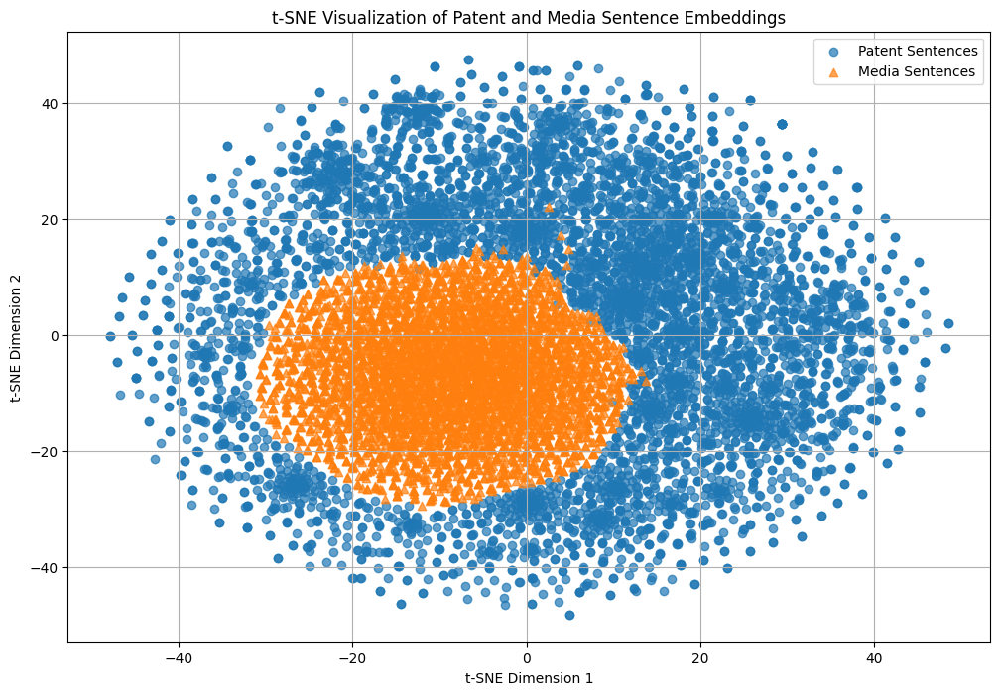

In [ ]:
# Set the random seed
random.seed(42)
np.random.seed(42)

# Infer document vectors for media and patent datasets (using the test data sets)
patent_doc_vectors = np.array([
    doc2vec_patent_model_dm.infer_vector(doc.words) for doc in tagged_data_patent_test
])
media_doc_vectors = np.array([
    doc2vec_media_model.infer_vector(doc.words) for doc in tagged_data_media_test
])

# Combine vectors for visualization
combined_sentence_embeddings = np.concatenate((patent_doc_vectors, media_doc_vectors), axis=0)

# Perform t-SNE for dimensionality reduction to 2D
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_results = tsne.fit_transform(combined_sentence_embeddings)

# Split back into patent and media vectors
n_patents = len(patent_doc_vectors)
tsne_patent_sentences = tsne_results[:n_patents]
tsne_media_sentences = tsne_results[n_patents:]

# Visualization
plt.figure(figsize=(12, 8))
plt.scatter(
    tsne_patent_sentences[:, 0], tsne_patent_sentences[:, 1],
    label='Patent Sentences', alpha=0.7, marker='o'
)
plt.scatter(
    tsne_media_sentences[:, 0], tsne_media_sentences[:, 1],
    label='Media Sentences', alpha=0.7, marker='^'
)
plt.legend()
plt.title("t-SNE Visualization of Patent and Media Sentence Embeddings")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid()
plt.show()



The two clusters of points (patent: blue and media: orange) are relatively distinct and do not appear to overlap a lot. This indicates that perhaps the Patent Model and Media Model represent sentence embeddings differently.

Let us try to visualize if there is any overlap by defining a treshold distance at which we consider that data points are close enough that they "overlap" in the t-SNE space:


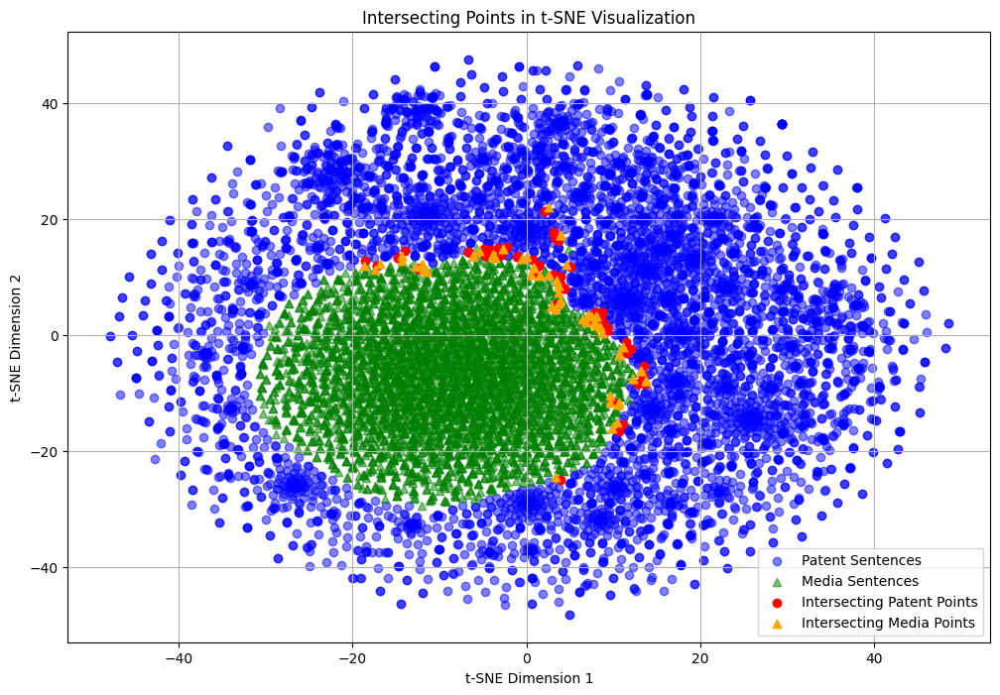

In [ ]:
## Visualize the intersecting data points from the media and the patent data sets

# Define a threshold for intersection
threshold = 1 # we take a very low value to be sure to select the highly similar points

# Compute pairwise distances between patent and media t-SNE points
distances = cdist(tsne_patent_sentences, tsne_media_sentences, metric='euclidean')

# Find intersecting points
patent_indices, media_indices = np.where(distances < threshold)

# Extract intersecting points
intersecting_patent_points = tsne_patent_sentences[patent_indices]
intersecting_media_points = tsne_media_sentences[media_indices]

# Visualize the intersecting points
plt.figure(figsize=(12, 8))
plt.scatter(tsne_patent_sentences[:, 0], tsne_patent_sentences[:, 1], label='Patent Sentences', alpha=0.5, marker='o', color='blue')
plt.scatter(tsne_media_sentences[:, 0], tsne_media_sentences[:, 1], label='Media Sentences', alpha=0.5, marker='^', color='green')
plt.scatter(intersecting_patent_points[:, 0], intersecting_patent_points[:, 1], label='Intersecting Patent Points', alpha=1.0, marker='o', color='red')
plt.scatter(intersecting_media_points[:, 0], intersecting_media_points[:, 1], label='Intersecting Media Points', alpha=1.0, marker='^', color='orange')
plt.legend()
plt.title("Intersecting Points in t-SNE Visualization")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid()
plt.show()

In [ ]:
## Concatenate for a joint analysis and apply KeyBERT

# Retrieve the content of the original data points
intersecting_patent_contents = [tagged_data_patent_test[idx].words for idx in patent_indices]
intersecting_media_contents = [tagged_data_media_test[idx].words for idx in media_indices]

# Make sure there are no repeating patents or articles
seen_media_indices = set()
intersecting_media_contents = list({
    idx: tagged_data_media_test[idx].words
    for idx in media_indices if idx not in seen_media_indices and not seen_media_indices.add(idx)
}.values())

seen_patent_indices = set()
intersecting_patent_contents = list({
    idx: tagged_data_patent_test[idx].words
    for idx in patent_indices if idx not in seen_patent_indices and not seen_patent_indices.add(idx)
}.values())

# Concatenation
all_content = [" ".join(content) for content in intersecting_patent_contents + intersecting_media_contents]

# Extract keywords and keyphrases
keywords = kw_model.extract_keywords(
    all_content,
    keyphrase_ngram_range=(1, 3),  # Consider unigrams and bigrams
    stop_words='english',
    top_n=10  # Get top 10 keywords
)

# Print the keywords
print(keywords)


[[('soil humidity detecting', 0.6637), ('soil humidity detection', 0.6493), ('humidity detecting based', 0.6008), ('photovoltaic detecting method', 0.5937), ('photovoltaic detecting', 0.5832), ('humidity detecting', 0.5806), ('photovoltaics comprises detection', 0.5698), ('based photovoltaic detecting', 0.5693), ('humidity detection based', 0.5679), ('humidity detection', 0.5661)], [('computer controlled greenhouse', 0.7201), ('controlled greenhouse', 0.6699), ('controlled greenhouse constructed', 0.658), ('provides climate management', 0.5768), ('greenhouse', 0.5537), ('climate management', 0.5474), ('greenhouse constructed', 0.5403), ('greenhouse constructed accordance', 0.5215), ('solar energy filtering', 0.513), ('climate management needs', 0.5033)], [('bidirectional water retaining', 0.6448), ('dam water retaining', 0.62), ('water retaining facility', 0.5614), ('bidirectional water', 0.5601), ('hydropower facilities bidirectional', 0.5527), ('facilities bidirectional water', 0.550

There are many keywords across the texts. Let's try to only select the most similar ones:

In [ ]:
filtered_keywords = [
    keyword
    for inner_list in keywords
    for keyword, score in inner_list
    if score > 0.7
]

# Print the filtered keywords
print(filtered_keywords)

['computer controlled greenhouse', 'hydrogen energy storage', 'energy storage hydrogen', 'storage hydrogen energy', 'producing hydrogen photovoltaic', 'hydrogen photovoltaic electrolysis', 'photovoltaic electrolysis hydrogen', 'hydrogen photovoltaic', 'sewage treatment device', 'palladium reduced graphene', 'hydrogen production photovoltaic', 'photovoltaic electrolytic hydrogen', 'production photovoltaic electrolytic', 'electrolytic hydrogen production', 'wind solar complementary', 'solar complementary heating', 'hydrogen energy storage', 'solar industry 2024', 'projects geomechanics geothermal', 'event geomechanics geothermal', 'geomechanics geothermal', 'geothermal industry colombia', 'geomechanics geothermal energy', 'exacerbating pollen seasons', 'allergies airborne pollen', 'pollen seasons asthma', 'exacerbating pollen', 'change exacerbating pollen', 'australian renewable energy', 'pfas chemicals', 'wind energy spain', 'wind power spain', 'exergy pertamina geothermal', 'scenarios 

What we find here in overlaping themes across data sets is a repeated mention of many different types of energy storage.

There is also a lot of mentions specifically of hydrogen energy.

Interestingly, hydrogen and photovoltaic energy are mentioned repeatedly together, which suggests that there is a lot of research and investment into the production of hydrogen as a replacement for fossil fuels using photovoltaic energy.
On this topic, "palladium reduced graphene" seems to refer to a technology that is used for H2 storage and sensor applications (https://www.tandfonline.com/doi/full/10.1080/10420150.2024.2318733).

Another particularily recurrent theme is geothermal energy and geomechanics, in particular in Germany and Colombia and in what seems to be deep distances underground.

Now we try to track the main keywords over time for each intersecting media articles and patents to draw additional conclusions

In [ ]:
# getting all the original columns for the data points
intersecting_media_rows = media_test_sentence[media_test_sentence.index.isin(media_indices)]
intersecting_patent_rows = patent_test_sentence[patent_test_sentence.index.isin(patent_indices)]

In [ ]:
# extract keywords with KeyBERT
def extract_keywords(text):
    """Extracts keywords using KeyBERT."""
    keywords = kw_model.extract_keywords(text, keyphrase_ngram_range=(1, 1), stop_words='english', top_n=5)  # Adjust parameters as needed
    return [keyword for keyword, score in keywords]

# Apply the function to the 'content' column and create the 'keywords' column
intersecting_media_rows['keywords'] = intersecting_media_rows['clean_content'].apply(extract_keywords)

<ipython-input-106-9ef26c9a40d1>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  intersecting_media_rows['keywords'] = intersecting_media_rows['clean_content'].apply(extract_keywords)


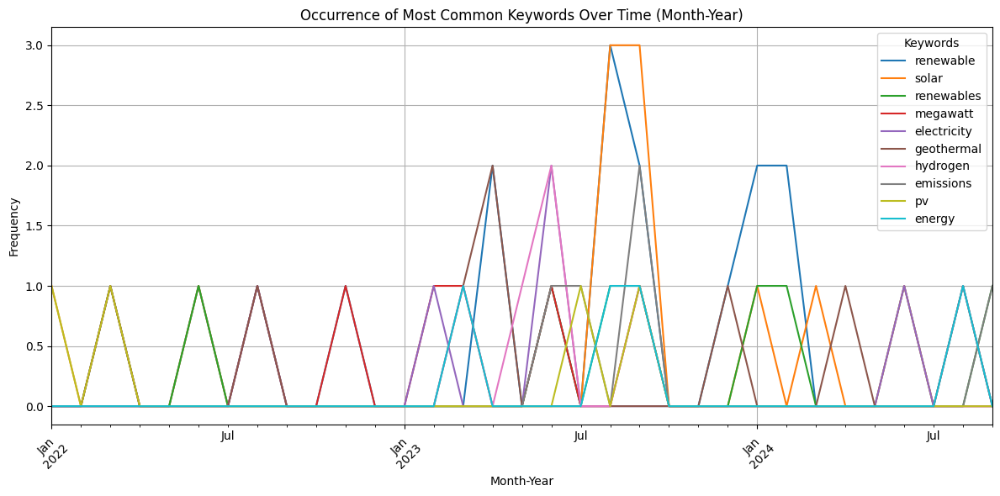

In [ ]:
warnings.filterwarnings("ignore")

#format the month-year column
intersecting_media_rows.loc[:, 'month_year'] = pd.to_datetime(intersecting_media_rows['date']).dt.to_period('M')

# Create a dictionary to store keyword counts per month-year
keyword_counts_by_month_year = {}

for index, row in intersecting_media_rows.iterrows():
    month_year = row['month_year']
    keywords = row['keywords']

    if month_year not in keyword_counts_by_month_year:
        keyword_counts_by_month_year[month_year] = Counter()

    keyword_counts_by_month_year[month_year].update(keywords)

# Create a DataFrame for plotting
keyword_counts_df = pd.DataFrame.from_dict(keyword_counts_by_month_year, orient='index').fillna(0)

# Select the top N most common keywords
top_keywords = keyword_counts_df.sum().sort_values(ascending=False).head(10).index

# Filter the DataFrame to include only the top keywords
keyword_counts_df = keyword_counts_df[top_keywords]

# Create a DataFrame for plotting with all possible month-year values
all_month_years = pd.period_range(intersecting_media_rows['month_year'].min(), intersecting_media_rows['month_year'].max(), freq='M')
keyword_counts_df = pd.DataFrame(index=all_month_years, columns=top_keywords).fillna(0)

# Update the DataFrame with the keyword counts
for month_year, counts in keyword_counts_by_month_year.items():
    for keyword, count in counts.items():
        if keyword in keyword_counts_df.columns:  # Check if keyword is in the top keywords
            keyword_counts_df.loc[month_year, keyword] = count

# Plot the line graph
keyword_counts_df.plot(figsize=(12, 6))
plt.title('Occurrence of Most Common Keywords Over Time (Month-Year)')
plt.xlabel('Month-Year')
plt.ylabel('Frequency')
plt.legend(title='Keywords')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Solar energy appears to have been particularily popular in July of last year.

Furthermore, hydrogen was also a popular topic around that time but has not been mentioned since 2023 in the subset of data we are considering.

What we notice is that the topic of lithium has also been popular in June last year, probably because its prices have been in sharp decline as the demand for electric vehicles has fallen significantly. This explains also why "emissions" were mentioned a lot a the time.

Lastly, geothermal has been a recurring topic as well.

In [ ]:
intersecting_patent_rows.columns

Index(['publication_number', 'country_code', 'title', 'abstract',
       'publication_date', 'inventor', 'cpc_code', 'clean_abstract',
       'keywords'],
      dtype='object')

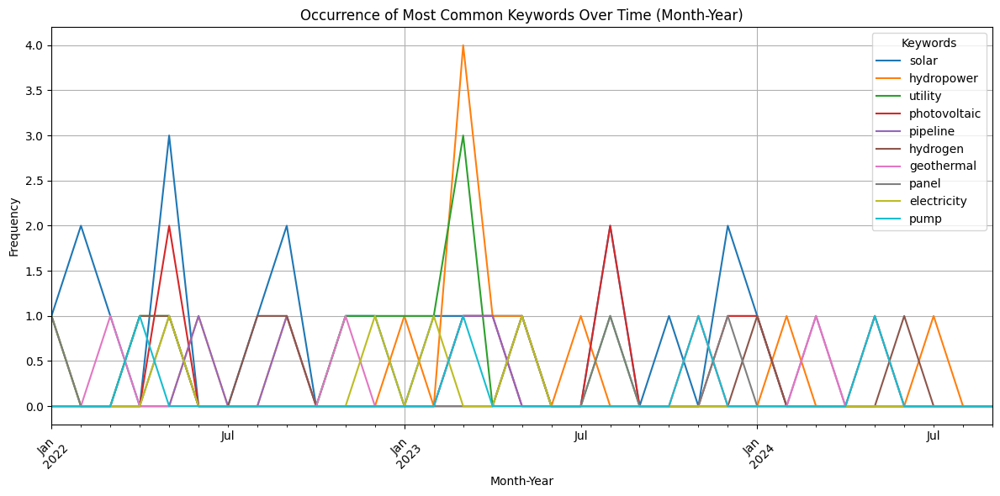

In [ ]:
warnings.filterwarnings("ignore")
# Extract keywords for patents
intersecting_patent_rows['keywords'] = intersecting_patent_rows['clean_abstract'].apply(extract_keywords)

# extract month-year
intersecting_patent_rows.loc[:, 'month_year'] = pd.to_datetime(intersecting_patent_rows['publication_date']).dt.to_period('M')

# Create a dictionary to store keyword counts per month-year
keyword_counts_by_month_year = {}

for index, row in intersecting_patent_rows.iterrows():
    month_year = row['month_year']
    keywords = row['keywords']

    if month_year not in keyword_counts_by_month_year:
        keyword_counts_by_month_year[month_year] = Counter()

    keyword_counts_by_month_year[month_year].update(keywords)

# Create a DataFrame for plotting
keyword_counts_df = pd.DataFrame.from_dict(keyword_counts_by_month_year, orient='index').fillna(0)

# Select the top N most common keywords
top_keywords = keyword_counts_df.sum().sort_values(ascending=False).head(10).index

# Filter the DataFrame to include only the top keywords
keyword_counts_df = keyword_counts_df[top_keywords]

# Create a DataFrame for plotting with all possible month-year values
all_month_years = pd.period_range(intersecting_media_rows['month_year'].min(), intersecting_media_rows['month_year'].max(), freq='M')
keyword_counts_df = pd.DataFrame(index=all_month_years, columns=top_keywords).fillna(0)

# Update the DataFrame with the keyword counts
for month_year, counts in keyword_counts_by_month_year.items():
    for keyword, count in counts.items():
        if keyword in keyword_counts_df.columns:  # Check if keyword is in the top keywords
            keyword_counts_df.loc[month_year, keyword] = count

# Plot the line graph
keyword_counts_df.plot(figsize=(12, 6))
plt.title('Occurrence of Most Common Keywords Over Time (Month-Year)')
plt.xlabel('Month-Year')
plt.ylabel('Frequency')
plt.legend(title='Keywords')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

What we notice is that instead of solar energy, here hydropower appears to have had a peak in frequency in 2023.

This being said, "photovoltaic" was mentioned more frequently around the same period as "solar" was in the media dataset. The topic of "solar" does re-occur periodically over 2 years, indicating that there are indeed quite a few innovations and advancements in that field that are reflected in the media articles as well.

"hydrogen" also appears a few times, but perhaps its "popularity" or marked appearance in the topics overall is mostly due to the media articles and not to any innovation in the field of research.


Here we can examine a bit closer the contents:

In [ ]:
for index, row in intersecting_patent_rows.iterrows():
    if any("hydrogen" in keyword.lower() for keyword in row['keywords']):
        print(row["title"])
        print(row["abstract"])
        print("---")

一种光伏电解制氢系统和方法
The embodiment of the invention provides a photovoltaic electrolytic hydrogen production system and a photovoltaic electrolytic hydrogen production method, which solve the problems that a photovoltaic panel is difficult to control in the process of producing hydrogen by electrolyzing water by directly coupling electrolytic hydrogen production equipment, and the working points of the photovoltaic panel and the electrolytic hydrogen production equipment deviate from the optimal working condition, realize that the electrolytic hydrogen production equipment produces hydrogen in the optimal working condition range while the photovoltaic panel works close to the maximum power point, have good safety and prolong the service life of the equipment. The photovoltaic electrolytic hydrogen production system provided by the embodiment of the invention has a simple structure, and has few intermediate links for directly coupling the photovoltaic panel with the electrolytic hydrogen prod

In [ ]:
for index, row in intersecting_media_rows.iterrows():
    if any("hydrogen" in keyword.lower() for keyword in row['keywords']):
        print(row["title"])
        print(row["content"])
        print("---")

New Efforts in Reducing Green Hydrogen Production Costs
['We use cookies to enhance your experience. By continuing to browse this site you agree to our use of cookies. More info.', 'As part of efforts to develop a decarbonized economy, green hydrogen, which produces hydrogen without the use of fossil fuels or the emission of carbon dioxide, has gained popularity recently.', 'However, the economic viability of green hydrogen has not been very high due to the high manufacturing cost of water electrolysis devices that generate green hydrogen. However, the discovery of a technique that substantially reduces the amount of rare metals utilized in polymer electrolyte membrane water electrolysis devices, like iridium and platinum, is paving the way for lower production costs.', 'Dr. Hyun S. Park and Sung Jong Yoo of the Korea Institute of Science and Technology’ s ( KIST) Hydrogen and Fuel Cell Research Center announced the development of a technology that can substantially decrease the quanti

---

## 4. Transfer Learning with Advanced Open-Source Models for Sentence Embeddings


### 4.1. Sentence-BERT for sentence embeddings

Sentence-BERT is an extension of BERT tailored for sentence embeddings. BERT learns contextual embeddings and considers the order of words in a sentence and captures the bidirectional context unlike other methods. It is able to be tuned for very specific contexts. S-BERT fine-tunes the BERT model on a siamese and triplet network structure, enabling it to generate semantically meaningful sentence embeddings.

Sentence-BERT uses a Siamese network-like architecture to provide two sentences as input. These two sentences are then passed to BERT models and a pooling layer to generate their embeddings. The embeddings for the pair of sentences are then used as inputs to calculate the cosine similarity.

We choose ```all-MiniLM-L6-v2``` since it is a model with fast inference, and good performance on semantic similarity tasks.
Is it good for general semantic comparison. It is already pre-trained on general-purpose datasets like the STS-Benchmark.

Sources used for the analysis work here below:
- https://sbert.net/docs/quickstart.html#sentence-transformer
- https://www.sbert.net/docs/package_reference/sentence_transformer/losses.html#contrastivetensionloss
- https://anirbansen2709.medium.com/sbert-how-to-use-sentence-embeddings-to-solve-real-world-problems-f950aa300c72
- https://www.pinecone.io/learn/series/nlp/dense-vector-embeddings-nlp/


We re-run the code at the beginning and we set the splits as follows:
- train_sentence: 60% of the data
- val_sentence: 20% of the data
- test_sentence: 20% of the data

We decided to make training data smaller than usual because we judge that the data is very complex and we also wanted to reduce the size of the train data for easier computation.

In [ ]:
# Split into train and temporary (train + validation) sets
media_train_temp, media_test_sentence = train_test_split(media_df, test_size=0.20, random_state=42)  # 20% for test
patent_train_temp, patent_test_sentence = train_test_split(patent_df, test_size=0.20, random_state=42)  # 20% for test

# Split the temporary set into train and validation sets
media_train_sentence, media_val_sentence = train_test_split(media_train_temp, test_size=0.25, random_state=42)  # 25% of remaining 80% (0.25 * 0.80 = 0.20) for validation
patent_train_sentence, patent_val_sentence = train_test_split(patent_train_temp, test_size=0.25, random_state=42)  # 25% of remaining 80% (0.25 * 0.80 = 0.20) for validation


In [ ]:
# save the data sets
media_train_sentence.to_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/media_train_sentence.csv', index=False)
media_test_sentence.to_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/media_test_sentence.csv', index=False)
media_val_sentence.to_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/media_val_sentence.csv', index=False)

patent_train_sentence.to_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/patent_train_sentence.csv', index=False)
patent_test_sentence.to_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/patent_test_sentence.csv', index=False)
patent_val_sentence.to_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/patent_val_sentence.csv', index=False)

In [ ]:
# Load train, validate and test datasets (sentences):
from google.colab import drive
drive.mount('/content/drive')
!pwd
!ls '/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/'
media_train_sentence = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/media_train_sentence.csv')
media_test_sentence = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/media_test_sentence.csv')
patent_train_sentence = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/patent_train_sentence.csv')
patent_test_sentence = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/patent_test_sentence.csv')
patent_val_sentence = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/patent_val_sentence.csv')
media_val_sentence = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/media_val_sentence.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content
CleanTech_22-24_updated.json		   media_train.csv
cleantech_media_dataset_v3_2024-10-28.csv  media_train_sentence.csv
df_media_v2.csv				   media_train_sentence_ORIGINAL.csv
df_patent_v2.csv			   media_val_sentence.csv
distilbert_model			   patent_test.csv
distilbert_similarity_model.pth		   patent_test_sentence.csv
doc2vec_media_model_dm.model		   patent_test_sentence_ORIGINAL.csv
doc2vec_media_model.model		   patent_train.csv
doc2vec_patent_model_dm.model		   patent_train_sentence.csv
doc2vec_patent_model.model		   patent_train_sentence_ORIGINAL.csv
glove.6B.zip				   patent_val_sentence.csv
media_test.csv				   RG65.csv
media_test_sentence.csv			   sts-train.csv
media_test_sentence_ORIGINAL.csv


#### 4.1.1. Media Dataset

First, we prepare our sentences:

In [ ]:
from transformers import AutoTokenizer
from nltk.tokenize import sent_tokenize

# Load the tokenizer
tokenizer = AutoTokenizer.from_pretrained('sentence-transformers/all-MiniLM-L6-v2')

# Split your articles into sentences
def split_into_sentences(text):
    # Use NLTK's sentence tokenizer to split the article into sentences
    return sent_tokenize(text)

# Truncate sentences and keep them without tokenization (you can adjust the max_length as needed)
def truncate_sentences(sentences, max_length=256):
    truncated_sentences = []
    for sentence in sentences:
        # Truncate by length using the tokenizer without actually tokenizing the text
        truncated_sentence = tokenizer.decode(tokenizer.encode(sentence, truncation=True, max_length=max_length, padding=False))
        truncated_sentences.append(truncated_sentence)
    return truncated_sentences

# Initialize a list to store all truncated sentences
all_truncated_sentences = []

# all_truncated_sentences contains all truncated sentences from the entire dataset
for i in range(len(media_train_sentence["content"])):
    article = media_train_sentence["content"].iloc[i]
    sentences = split_into_sentences(article)
    truncated_sentences = truncate_sentences(sentences)
    all_truncated_sentences.extend(truncated_sentences) # Append the truncated sentences for the current article to the main list


In [ ]:
len(all_truncated_sentences)

407575

In [ ]:
num_samples = 10000  # Number of sentences to sample
small_sent = random.sample(all_truncated_sentences, num_samples)
train_sentences = small_sent  #------ to change to "all_truncated_sentences" later on

Here we just see what kind of clustering an untrained model can output:

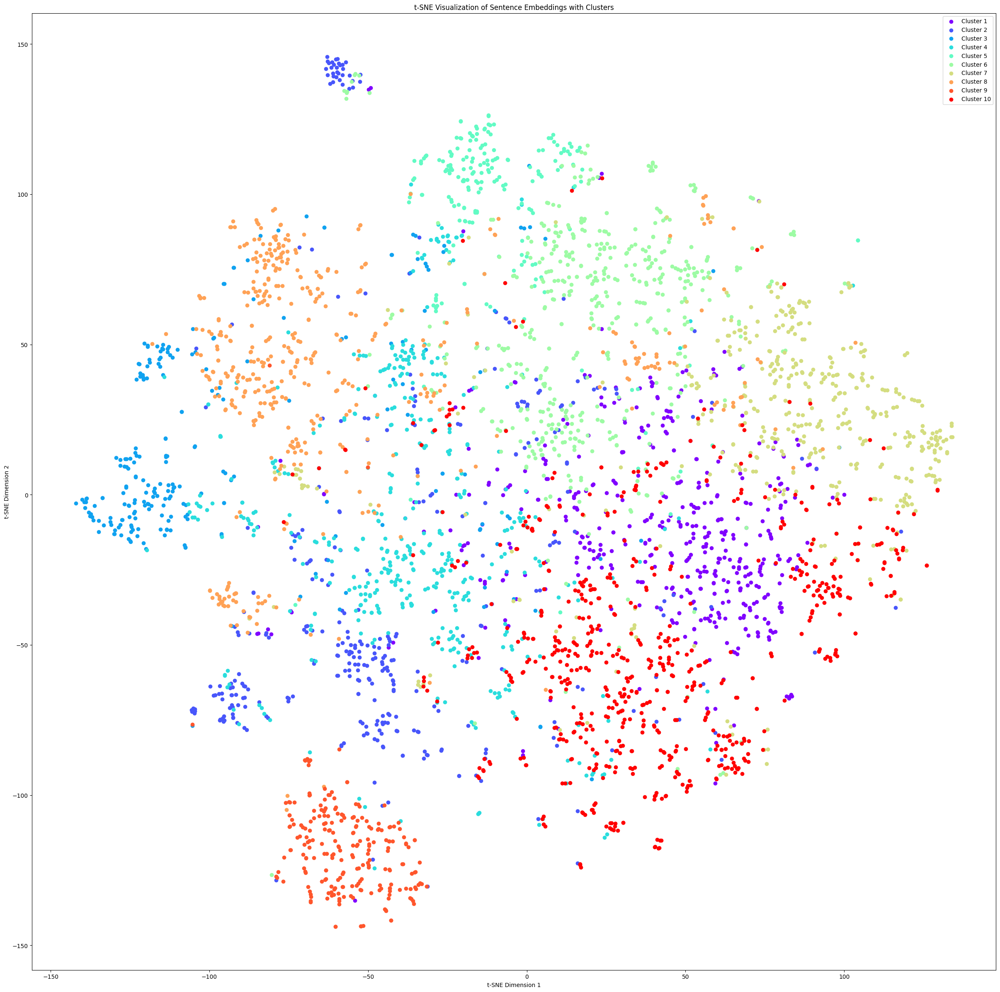

In [ ]:
random.seed(42)
np.random.seed(42)

from sentence_transformers import SentenceTransformer, losses, datasets, InputExample
from sentence_transformers.losses import ContrastiveTensionDataLoader

model = SentenceTransformer('all-MiniLM-L6-v2')

#create sentence embeddings
sentence_embeddings_media = model.encode(media_test_sentence['content'])

#t-SNE Visualization

# We apply t-SNE:
tsne = TSNE(n_components=2, random_state=42, n_iter=5000, perplexity=10)
embeddings_2d = tsne.fit_transform(sentence_embeddings_media)

# We perform clustering with K-means:
num_clusters = 10
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(sentence_embeddings_media)

# We visualize with colored clusters:
colors = cm.rainbow(np.linspace(0, 1, num_clusters))
plt.figure(figsize=(30, 30))

# Plot points with cluster-specific colors
for i, color in zip(range(num_clusters), colors):
    cluster_points = embeddings_2d[cluster_labels == i] # Get points belonging to the current cluster
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], color=color, label=f'Cluster {i + 1}') # Plot with cluster color

# Plot:
plt.title('t-SNE Visualization of Sentence Embeddings with Clusters')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend()
plt.show()

Not very clear clusters over the dataset.

In [ ]:
random.seed(42)
np.random.seed(42)

from sentence_transformers import SentenceTransformer, losses, datasets, InputExample
from sentence_transformers.losses import ContrastiveTensionDataLoader

model = SentenceTransformer('all-MiniLM-L6-v2')
train_dataloader = ContrastiveTensionDataLoader(small_sent, batch_size=3, pos_neg_ratio=3)
train_loss = losses.ContrastiveTensionLoss(model=model)

model.old_fit(
    [(train_dataloader, train_loss)],
    epochs=3,
)

Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Iteration:   0%|          | 0/1666 [00:00<?, ?it/s]

Iteration:   0%|          | 0/1666 [00:00<?, ?it/s]

Iteration:   0%|          | 0/1666 [00:00<?, ?it/s]

We use the validation set to find the best hyperparameters:

In [ ]:
# Initialize a list to store all truncated sentences
val_sentences = []

for i in range(len(media_val_sentence["content"])):
    article = media_val_sentence["content"].iloc[i]
    sentences = split_into_sentences(article)
    truncated_sentences = truncate_sentences(sentences)
    val_sentences.extend(truncated_sentences)

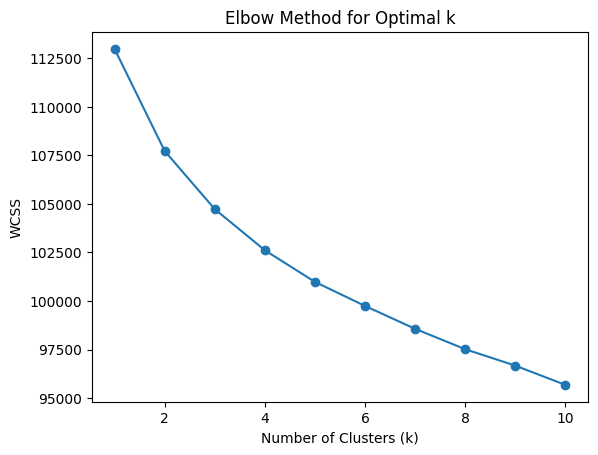

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


val_embeddings = model.encode(val_sentences)

wcss = []
for i in range(1, 11):  # Test k values from 1 to 10
   kmeans = KMeans(n_clusters=i, random_state=42)
   kmeans.fit(val_embeddings)  # Use your validation embeddings
   wcss.append(kmeans.inertia_)  # Inertia is WCSS

plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.show()

In [ ]:

from sklearn.model_selection import GridSearchCV
from sentence_transformers import SentenceTransformer, losses
from sentence_transformers.readers import InputExample
from torch.utils.data import DataLoader
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator, ClassifierMixin  # Import BaseEstimator
from sentence_transformers import SentenceTransformer, losses
from sentence_transformers.readers import InputExample
from torch.utils.data import DataLoader
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

params = {
    'batch_size': 33,
    'pos_neg_ratio': 3,
    'warmup_steps': 50
}

param_grid = {
    'epochs': [5, 10, 15],
    'learning_rate': [1e-4, 1e-5, 1e-6],
}

silhouette_avg = {
    'epochs': [],
    'learning_rate': [],
    'silhouette_score': []
}

for epoch in param_grid['epochs']:
    for learning_rate in param_grid['learning_rate']:
       model = SentenceTransformer('all-MiniLM-L6-v2')
       train_dataloader = ContrastiveTensionDataLoader(train_sentences, batch_size=params['batch_size'], pos_neg_ratio=params['pos_neg_ratio'])
       train_loss = losses.ContrastiveTensionLoss(model=model)

       model.old_fit(
           train_objectives=[(train_dataloader, train_loss)],
           epochs=epoch,
           optimizer_params={'lr': learning_rate},
           warmup_steps=params['warmup_steps']
       )

       val_embeddings = model.encode(val_sentences)
       kmeans = KMeans(n_clusters=10, random_state=42)
       cluster_labels = kmeans.fit_predict(val_embeddings)
       silhouette_avg['silhouette_score'].append(silhouette_score(val_embeddings, cluster_labels))
       silhouette_avg['epochs'].append(epoch)
       silhouette_avg['learning_rate'].append(learning_rate)

       print(f"Epoch: {epoch}, Learning Rate: {learning_rate}, Silhouette Score: {silhouette_avg['silhouette_score'][-1]}")


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Epoch: 5, Learning Rate: 0.0001, Silhouette Score: 0.05062291771173477


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Epoch: 5, Learning Rate: 1e-05, Silhouette Score: 0.047287870198488235


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Epoch: 5, Learning Rate: 1e-06, Silhouette Score: 0.037934090942144394


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Epoch: 10, Learning Rate: 0.0001, Silhouette Score: 0.06495268642902374


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Epoch: 10, Learning Rate: 1e-05, Silhouette Score: 0.039474114775657654


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Epoch: 10, Learning Rate: 1e-06, Silhouette Score: 0.04043238237500191


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Epoch: 15, Learning Rate: 0.0001, Silhouette Score: 0.11251350492238998


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Epoch: 15, Learning Rate: 1e-05, Silhouette Score: 0.04170134291052818


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration:   0%|          | 0/151 [00:00<?, ?it/s]

Epoch: 15, Learning Rate: 1e-06, Silhouette Score: 0.031581904739141464
The best parameters are: {'epochs': 15, 'learning_rate': 1e-06} for score 0.031581904739141464


In [ ]:
argmax_index = np.argmax(silhouette_avg['silhouette_score'])
best_params = {

    'epochs': silhouette_avg['epochs'][argmax_index],
    'learning_rate': silhouette_avg['learning_rate'][argmax_index]
}
print(f"The best parameters are: {best_params} for score {silhouette_avg['silhouette_score'][argmax_index]}")

The best parameters are: {'epochs': 15, 'learning_rate': 0.0001} for score 0.11251350492238998


Based on the above, the best hyperparameters would be : 'epochs': 15 and 'learning_rate': 0.0001

We fine-tune the model on the full training dataset using those hyperparameters and we apply it on the test dataset.

In [ ]:
#We train/fine-tune the model on half of "all_truncated_sentences" from the training data set
random.seed(42)
np.random.seed(42)

num_samples = 203787  # Number of sentences to sample
small_sent = random.sample(all_truncated_sentences, num_samples)

from sentence_transformers import SentenceTransformer, losses, datasets, InputExample
from sentence_transformers.losses import ContrastiveTensionDataLoader

model_final = SentenceTransformer('all-MiniLM-L6-v2')
train_dataloader = ContrastiveTensionDataLoader(small_sent, batch_size=33, pos_neg_ratio=3)
train_loss = losses.ContrastiveTensionLoss(model=model_final)

model_final.old_fit(
    [(train_dataloader, train_loss)],
    epochs=15,
    optimizer_params={'lr': 0.0001},
    warmup_steps=50,
    show_progress_bar=True)


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3087 [00:00<?, ?it/s]

In [ ]:
#Save the model
model_save_path = '/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/S_BERT.model'
model_final.save(model_save_path)

In [ ]:
random.seed(42)
np.random.seed(42)

#create sentence embeddings
sentence_embeddings_media = model_final.encode(media_test_sentence['content'])

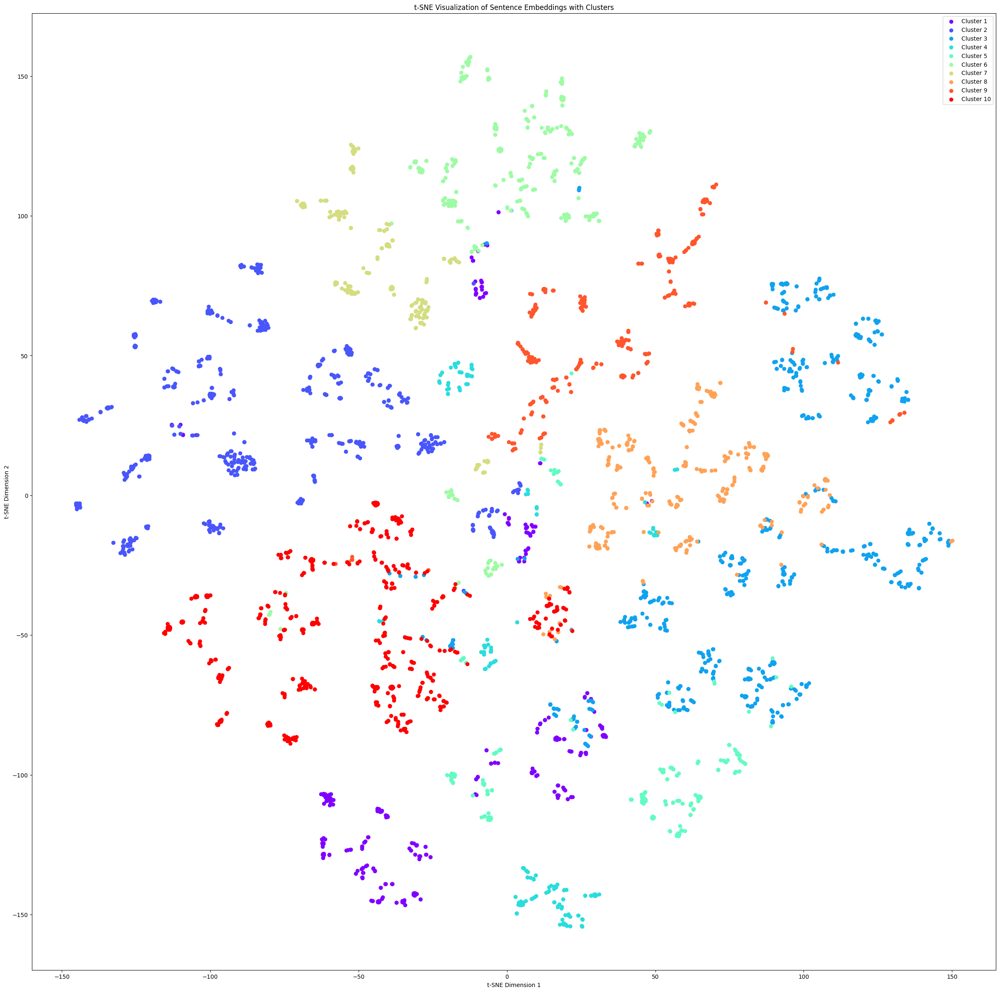

In [ ]:
random.seed(42)
np.random.seed(42)

#t-SNE Visualization

# We apply t-SNE:
tsne = TSNE(n_components=2, random_state=42, n_iter=5000, perplexity=10)
embeddings_2d = tsne.fit_transform(sentence_embeddings_media)

# We prform clustering with K-means:
num_clusters = 10
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(sentence_embeddings_media)

# We visualize with colored clusters:
colors = cm.rainbow(np.linspace(0, 1, num_clusters))
plt.figure(figsize=(30, 30))

# Plot points with cluster-specific colors
for i, color in zip(range(num_clusters), colors):
    cluster_points = embeddings_2d[cluster_labels == i] # Get points belonging to the current cluster
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], color=color, label=f'Cluster {i + 1}') # Plot with cluster color

# Plot:
plt.title('t-SNE Visualization of Sentence Embeddings with Clusters')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend()
plt.show()

The clustering looks a lot more distinct than before the training. We now need to investigate the groups and what looks like many "sub-groups" within k-means clusters

We investigate most distinct clusters, which appear to be found within clusters 1, 2 and 3

In [ ]:
# We try to investigate "sub-clusters" within clusters

cluster_1_data = sentence_embeddings_media[cluster_labels == 0]  # Data for cluster 1

sub_kmeans = KMeans(n_clusters=4, random_state=42)  # Try 4 sub-clusters as per the visualization above
sub_cluster_labels = sub_kmeans.fit_predict(cluster_1_data)

sub_embeddings_2d = tsne.fit_transform(cluster_1_data)

In [ ]:
cluster_1_indices = np.where(cluster_labels == 0)[0]

for sub_cluster_id in range(4):  # Iterate through sub-clusters
    # Get indices of sentences in this sub-cluster
    sub_cluster_indices_in_cluster_1 = cluster_1_indices[sub_cluster_labels == sub_cluster_id]

    # Access original sentences from media_test_sentence using the indices
    original_sentences = media_test_sentence.iloc[sub_cluster_indices_in_cluster_1]['content'] # Access the 'content' column

    print(f"Sub-cluster {sub_cluster_id}:")
    # Print or process original_sentences as needed
    for sentence in original_sentences:
        print(sentence)
    print("\n")

Sub-cluster 0:
['In this pv magazine Webinar, the ways in which solar power management can be delivered through smart monitoring will be set out in detail. The experience of project operators in India will also be presented – including case studies demonstrating the benefits of smart energy management.', 'Effective PV plant monitoring has long been understood in terms of its role in optimizing performance and identifying and addressing issues when they arise. Monitoring’ s role in managing solar power and maximizing its value is now being better understood – delivering stronger returns for project owners.', 'For commercial and industrial ( C & I) customers in India and elsewhere in Asia, power management is of particular importance. With feed-in tariffs declining, ensuring that the amount of PV power generated is used on-site, whether that be a warehouse, office building, or factory, can make a big impact on the financial efficacy of a solar system.', 'The optimization of solar “ self 

In [ ]:
cluster_1_indices = np.where(cluster_labels == 0)[0]

for sub_cluster_id in range(4):  # Iterate through sub-clusters
    # Get indices of sentences in this sub-cluster
    sub_cluster_indices_in_cluster_1 = cluster_1_indices[sub_cluster_labels == sub_cluster_id]

    # Access original sentences from media_test_sentence using the indices
    original_sentences = media_test_sentence.iloc[sub_cluster_indices_in_cluster_1]['content']

    print(f"Sub-cluster {sub_cluster_id}:")

    # Named Entity Recognition
    company_names = []
    for sentence in original_sentences:
        doc = nlp(sentence)
        for ent in doc.ents:
            if ent.label_ == "ORG":  # Extract organizations (company names)
                company_names.append(ent.text)

    # Print company names with frequency
    print(Counter(company_names).most_common(10))  # Print top 10 most frequent company names
    print("\n")

Sub-cluster 0:
[('CleanTechnica', 16), ('publications & more', 15), ('XPRT Media All Rights Reserved', 15), ('LLC', 14), ('EU', 13), ('Electrex', 12), ('Xiamen Photons Solar Technology Co.. Ltd', 9), ('Radial Power', 9), ('RWE', 9), ('Solar Energy', 8)]


Sub-cluster 1:
[('CleanTechnica', 51), ('MW', 48), ('publications & more', 34), ('XPRT Media All Rights Reserved', 34), ('EV', 27), ('Data Protection Policy', 26), ('CSP', 25), ('SunPower', 19), ('Sun Exchange', 16), ('Mercedes-Benz', 15)]


Sub-cluster 2:
[('MW', 35), ('publications & more', 22), ('XPRT Media All Rights Reserved', 22), ('GSI', 13), ('Data Protection Policy', 12), ('NAFTC', 12), ('EPC', 11), ('COLORADO', 11), ('VAT', 11), ('Solar Energy', 10)]


Sub-cluster 3:
[('MW', 22), ('CleanTechnica', 22), ('AI', 20), ('EU', 18), ('publications & more', 15), ('XPRT Media All Rights Reserved', 15), ('SunPower', 14), ('Solar Power World', 13), ('RustMo', 13), ('Meyer Burger', 12)]




In [ ]:
cluster_1_indices = np.where(cluster_labels == 0)[0]
kw_model = KeyBERT()  # Initialize KeyBERT model

for sub_cluster_id in range(4):  # Iterate through sub-clusters
    # Get indices of sentences in this sub-cluster
    sub_cluster_indices_in_cluster_1 = cluster_1_indices[sub_cluster_labels == sub_cluster_id]

    # Access original sentences from media_test_sentence using the indices
    original_sentences = media_test_sentence.iloc[sub_cluster_indices_in_cluster_1]['content']

    print(f"Sub-cluster {sub_cluster_id}:")

    # Combine sentences in the sub-cluster into a single document
    document = ' '.join(original_sentences.tolist())

    # Extract keywords using KeyBERT
    keywords = kw_model.extract_keywords(document, keyphrase_ngram_range=(1, 2), top_n=10)  # Adjust ngram_range and top_n as needed

    print(keywords)
    print("\n")

Sub-cluster 0:
[('monitoring photovoltaic', 0.6326), ('photovoltaic industry', 0.6078), ('managing solar', 0.6078), ('solar maintenance', 0.5922), ('solar electricity', 0.5878), ('smart solar', 0.5872), ('pv monitoring', 0.5825), ('develop photovoltaic', 0.5661), ('solar photovoltaic', 0.5652), ('monitoring pv', 0.5621)]


Sub-cluster 1:
[('cables awm', 0.637), ('awm cable', 0.5978), ('cable hangers', 0.5767), ('lifespan cables', 0.562), ('cables designed', 0.5586), ('cable hanger', 0.5523), ('cable management', 0.5399), ('cables hanger', 0.5341), ('affordable wire', 0.5186), ('wire management', 0.5145)]


Sub-cluster 2:
[('california energy', 0.5915), ('financing renewables', 0.5391), ('energy renewables', 0.5269), ('powered renewables', 0.5159), ('renewable project', 0.5114), ('renewables account', 0.5068), ('renewable energy', 0.5043), ('energy solarvest', 0.5043), ('energy projects', 0.5001), ('energy renewable', 0.4996)]


Sub-cluster 3:
[('institute solar', 0.6431), ('projects so

Here we can see that the photovoltaic industry and solar energy are very prominent themes in these sub-clusters and that Xiamen Photons Solar Technology Co. Ltd was among the most mentioned company in association to these themes.

In [ ]:
# Data for cluster 2
cluster_2_data = sentence_embeddings_media[cluster_labels == 1]

# Try 20 sub-clusters
sub_kmeans = KMeans(n_clusters=20, random_state=42)
# Fit the sub_kmeans model to the cluster_2_data and get sub-cluster labels
sub_cluster_labels = sub_kmeans.fit_predict(cluster_2_data)

#sub_embeddings_2d = tsne.fit_transform(cluster_2_data)


cluster_2_indices = np.where(cluster_labels == 1)[0] # Corrected this line

for sub_cluster_id in range(20):  # Iterate through sub-clusters
    # Get indices of sentences in this sub-cluster
    # Use sub_cluster_labels computed for cluster_2_data
    sub_cluster_indices_in_cluster_2 = cluster_2_indices[sub_cluster_labels == sub_cluster_id]

    # Access original sentences from media_test_sentence using the indices
    original_sentences = media_test_sentence.iloc[sub_cluster_indices_in_cluster_2]['content'] # Access the 'content' column


In [ ]:
# Load the spaCy model
nlp = spacy.load("en_core_web_sm")

# We try to investigate "sub-clusters" within clusters

# Data for cluster 2 (cluster_labels == 1)
cluster_2_data = sentence_embeddings_media[cluster_labels == 1]

# Try 20 sub-clusters (or adjust as needed based on your analysis)
sub_kmeans = KMeans(n_clusters=20, random_state=42)
# Fit the sub_kmeans model to the cluster_2_data and get sub-cluster labels
sub_cluster_labels = sub_kmeans.fit_predict(cluster_2_data)

# Get indices for cluster 2 (cluster_labels == 1)
cluster_2_indices = np.where(cluster_labels == 1)[0]

for sub_cluster_id in range(20):  # Iterate through sub-clusters
    # Get indices of sentences in this sub-cluster
    # Use sub_cluster_labels computed for cluster_2_data
    sub_cluster_indices_in_cluster_2 = cluster_2_indices[sub_cluster_labels == sub_cluster_id]

    # Access original sentences from media_test_sentence using the indices
    original_sentences = media_test_sentence.iloc[sub_cluster_indices_in_cluster_2]['content']

    print(f"Sub-cluster {sub_cluster_id}:")

    # Named Entity Recognition
    company_names = []
    for sentence in original_sentences:
        doc = nlp(sentence)
        for ent in doc.ents:
            if ent.label_ == "ORG":  # Extract organizations (company names)
                company_names.append(ent.text)

    # Print company names with frequency
    print(Counter(company_names).most_common(10))  # Print top 10 most frequent company names
    print("\n")

/usr/local/lib/python3.10/dist-packages/spacy/util.py:1740: UserWarning: [W111] Jupyter notebook detected: if using `prefer_gpu()` or `require_gpu()`, include it in the same cell right before `spacy.load()` to ensure that the model is loaded on the correct device. More information: http://spacy.io/usage/v3#jupyter-notebook-gpu
  warnings.warn(Warnings.W111)


Sub-cluster 0:
[('EV', 31), ('MW', 17), ('CleanTechnica', 16), ('REA', 16), ('publications & more', 14), ('XPRT Media All Rights Reserved', 14), ('LFP', 14), ('CATL', 13), ('KOSPO', 12), ('EU', 11)]


Sub-cluster 1:
[('MW', 46), ('CSP', 11), ('Data Protection Policy', 10), ('Qair', 10), ('Larsen & Toubro', 9), ('Qcells', 9), ('SMA', 9), ('Clearloop', 9), ('Solar Industry', 8), ('Copyright Zackin Publications Inc.', 8)]


Sub-cluster 2:
[('MW', 26), ('publications & more', 22), ('XPRT Media All Rights Reserved', 22), ('EV', 18), ('EU', 16), ('Hawaiian Electric', 16), ('Nextracker', 13), ('Data Protection Policy', 10), ('CleanTechnica', 10), ('Advanced Energy Industries', 9)]


Sub-cluster 3:
[('MW', 14), ('Tesla', 14), ('Solar Energy', 10), ('CleanTechnica', 10), ('USB', 8), ('SECI', 7), ('Data Protection Policy', 6), ('CSP', 6), ('Runhood', 6), ('Xcel Energy', 5)]


Sub-cluster 4:
[('AC', 12), ('ABC', 11), ('EU', 10), ('PVH', 10), ('CleanTechnica', 9), ('MW', 8), ('AIKO', 6), ('Tesla',

In [ ]:
# Get indices for cluster 2 (cluster_labels == 1)
cluster_2_indices = np.where(cluster_labels == 1)[0]

for sub_cluster_id in range(20):  # Iterate through sub-clusters
    # Get indices of sentences in this sub-cluster
    sub_cluster_indices_in_cluster_2 = cluster_2_indices[sub_cluster_labels == sub_cluster_id]

    # Access original sentences from media_test_sentence using the indices
    original_sentences = media_test_sentence.iloc[sub_cluster_indices_in_cluster_2]['content']

    print(f"Sub-cluster {sub_cluster_id}:")

    # Combine sentences in the sub-cluster into a single document
    document = ' '.join(original_sentences.tolist())

    # Extract keywords using KeyBERT
    keywords = kw_model.extract_keywords(document, keyphrase_ngram_range=(1, 2), top_n=10)  # Adjust ngram_range and top_n as needed

    print(keywords)
    print("\n")

Sub-cluster 0:
[('zinc batteries', 0.6043), ('economics batteries', 0.5975), ('batteries industry', 0.5925), ('battery production', 0.5816), ('enerpoly batteries', 0.5806), ('manufacture zinc', 0.5716), ('battery factories', 0.5444), ('batteries market', 0.5431), ('innovation battery', 0.5414), ('battery industry', 0.5324)]


Sub-cluster 1:
[('creek renewables', 0.5093), ('energy projects', 0.4825), ('solar infrastructure', 0.4794), ('energy installations', 0.4755), ('renewable projects', 0.4748), ('solar projects', 0.4726), ('projects solar', 0.4706), ('power renewable', 0.4677), ('energy pv', 0.4657), ('power solar', 0.4637)]


Sub-cluster 2:
[('tester solar', 0.6454), ('test solar', 0.634), ('solar wafer', 0.6293), ('inspection photovoltaic', 0.6032), ('solar wafers', 0.5938), ('photovoltaic powermeter', 0.5863), ('solar monitoring', 0.5849), ('monitoring solar', 0.576), ('solar sensors', 0.5711), ('inspect solar', 0.5704)]


Sub-cluster 3:
[('bulgaria energy', 0.614), ('energy bulg

Some of the most recurrent companies are: Hawaiian Electric, Hyundai, Volkswagen, Tesla and Ford. It appears that within this cluster there have been a lot of mentions about the automative industry main actors.

In terms of topics, we get a lot of mention in sub-cluster 4 about "microinverters" and in sub-ckuster 15 about "solar cells". In the sub-cluster 12, microbatteries are mentioned a lot. Sub-cluster 9 seems to be all about Tesla. Overall, the theme in this cluster appears to be energy storage and how to make it more efficient with particular attention to the automotive industry.

Interestingly, Toyota seems to be associated to renewable biogas.

Solar energy seems to be developing in Bulgaria since they are both mentioned in cluster 3.

In [ ]:
# Data for cluster 3
cluster_3_data = sentence_embeddings_media[cluster_labels == 2]

# Try 20 sub-clusters
sub_kmeans = KMeans(n_clusters=10, random_state=42)
# Fit the sub_kmeans model to the cluster_3_data and get sub-cluster labels
sub_cluster_labels = sub_kmeans.fit_predict(cluster_3_data)

cluster_3_indices = np.where(cluster_labels == 2)[0] # Corrected this line

for sub_cluster_id in range(10):  # Iterate through sub-clusters
    # Get indices of sentences in this sub-cluster
    # Use sub_cluster_labels computed for cluster_2_data
    sub_cluster_indices_in_cluster_3 = cluster_3_indices[sub_cluster_labels == sub_cluster_id]

    # Access original sentences from media_test_sentence using the indices
    original_sentences = media_test_sentence.iloc[sub_cluster_indices_in_cluster_3]['content'] # Access the 'content' column

In [ ]:
# Load the spaCy model (make sure you have downloaded it: !python -m spacy download en_core_web_sm)
nlp = spacy.load("en_core_web_sm")

# Data for cluster 3 (cluster_labels == 2)
cluster_3_data = sentence_embeddings_media[cluster_labels == 2]

# Try 10 sub-clusters
sub_kmeans = KMeans(n_clusters=10, random_state=42)
# Fit the sub_kmeans model to the cluster_3_data and get sub-cluster labels
sub_cluster_labels = sub_kmeans.fit_predict(cluster_3_data)

# Get indices for cluster 3 (cluster_labels == 2)
cluster_3_indices = np.where(cluster_labels == 2)[0]

for sub_cluster_id in range(10):  # Iterate through sub-clusters
    # Get indices of sentences in this sub-cluster
    # Use sub_cluster_labels computed for cluster_3_data
    sub_cluster_indices_in_cluster_3 = cluster_3_indices[sub_cluster_labels == sub_cluster_id]

    # Access original sentences from media_test_sentence using the indices
    original_sentences = media_test_sentence.iloc[sub_cluster_indices_in_cluster_3]['content']

    print(f"Sub-cluster {sub_cluster_id}:")

    # Named Entity Recognition
    company_names = []
    for sentence in original_sentences:
        doc = nlp(sentence)
        for ent in doc.ents:
            if ent.label_ == "ORG":  # Extract organizations (company names)
                company_names.append(ent.text)

    # Print company names with frequency
    print(Counter(company_names).most_common(10))  # Print top 10 most frequent company names
    print("\n")

/usr/local/lib/python3.10/dist-packages/spacy/util.py:1740: UserWarning: [W111] Jupyter notebook detected: if using `prefer_gpu()` or `require_gpu()`, include it in the same cell right before `spacy.load()` to ensure that the model is loaded on the correct device. More information: http://spacy.io/usage/v3#jupyter-notebook-gpu
  warnings.warn(Warnings.W111)


Sub-cluster 0:
[('LNG', 45), ('IEA', 36), ('NGI', 31), ('Oxford Instruments Asylum Research', 20), ('CleanTechnica', 19), ('Tesla', 18), ('ISSN', 15), ('IGA', 14), ('MW', 13), ('BLM', 12)]


Sub-cluster 1:
[('Oxford Instruments Asylum Research', 70), ('TOFWERK', 51), ('National Project Coordinator', 51), ('the United Nations Industrial Development Organization', 51), ('the Co-Founder of A Plastic Planet', 51), ("International Women's Day", 51), ('Clean Technology', 51), ('MHW', 42), ('DN Media Group', 35), ('MIT', 34)]


Sub-cluster 2:
[('EV', 56), ('Tesla', 43), ('CleanTechnica', 41), ('NGI', 40), ('DN Media Group', 35), ('MW', 25), ('LNG', 24), ('XPeng', 24), ('Hyundai', 23), ('ISSN', 22)]


Sub-cluster 3:
[('Oxford Instruments Asylum Research', 70), ('TOFWERK', 40), ('National Project Coordinator', 40), ('the United Nations Industrial Development Organization', 40), ('the Co-Founder of A Plastic Planet', 40), ("International Women's Day", 40), ('Clean Technology', 40), ('DN Media Gr

In [ ]:
# Get indices for cluster 2 (cluster_labels == 2)
cluster_3_indices = np.where(cluster_labels == 2)[0]

for sub_cluster_id in range(10):  # Iterate through sub-clusters
    # Get indices of sentences in this sub-cluster
    sub_cluster_indices_in_cluster_3 = cluster_3_indices[sub_cluster_labels == sub_cluster_id]

    # Access original sentences from media_test_sentence using the indices
    original_sentences = media_test_sentence.iloc[sub_cluster_indices_in_cluster_3]['content']

    print(f"Sub-cluster {sub_cluster_id}:")

    # Combine sentences in the sub-cluster into a single document
    document = ' '.join(original_sentences.tolist())

    # Extract keywords using KeyBERT
    keywords = kw_model.extract_keywords(document, keyphrase_ngram_range=(1, 2), top_n=10)  # Adjust ngram_range and top_n as needed

    print(keywords)
    print("\n")

Sub-cluster 0:
[('hydrogen infrastructure', 0.7271), ('hydrogen projects', 0.6845), ('hydrogen operational', 0.6777), ('building hydrogen', 0.6763), ('funding hydrogen', 0.6762), ('hydrogen refueling', 0.6759), ('fuel hydrogen', 0.6736), ('hydrogen fuelling', 0.6726), ('future hydrogen', 0.6663), ('hydrogen fuel', 0.6633)]


Sub-cluster 1:
[('maintain forests', 0.6089), ('maintaining forest', 0.5894), ('tree diversity', 0.5805), ('forest conservation', 0.5713), ('forests conserving', 0.5697), ('forests carbon', 0.5672), ('benefits forestry', 0.5653), ('save forests', 0.5637), ('forests crucial', 0.5634), ('sustainable forest', 0.5587)]


Sub-cluster 2:
[('wind technologies', 0.6474), ('lidar wind', 0.634), ('assessment wind', 0.588), ('applications wind', 0.5805), ('wind projects', 0.5575), ('wind resource', 0.5524), ('china lidar', 0.5507), ('wind measurement', 0.5486), ('sensors wind', 0.5476), ('wind turbine', 0.5424)]


Sub-cluster 3:
[('lng plaquemines', 0.5795), ('plaquemines con

For these sub-clusters, Tesla is a very recurrent mention as well. Now we see more mentions of NGOs such as the United Nations Industrial Development Organization (sub-cluster 3). Technologies that are very recurrent here are hydrogen (sub-cluster 0 and 4) as well as LNG gas (sub-cluster 3), semiconductors (sub-cluster 7) and geothermal (sub-cluster 8). No particular entity seems to be associated to a very specific technology.

#### 4.1.2. Patents Dataset

We proceed the same but for patents dataset. We first prepare the training sentences.

In [ ]:
from transformers import AutoTokenizer
from nltk.tokenize import sent_tokenize

# Load the tokenizer
tokenizer = AutoTokenizer.from_pretrained('sentence-transformers/all-MiniLM-L6-v2')

# Initialize a list to store all truncated sentences
all_truncated_sentences = []

# all_truncated_sentences contains all truncated sentences from the entire dataset
for i in range(len(patent_train_sentence["clean_abstract"])):
    article = patent_train_sentence["clean_abstract"].iloc[i]
    sentences = split_into_sentences(article)
    truncated_sentences = truncate_sentences(sentences)
    all_truncated_sentences.extend(truncated_sentences) # Append the truncated sentences for the current article to the main list

In [ ]:
len(all_truncated_sentences)

40655

In [ ]:
# We use just a subset of the sentences for grid search
num_samples = 20000  # Number of sentences to sample
small_sent = random.sample(all_truncated_sentences, num_samples)
train_sentences = small_sent  #------ to change to "all_truncated_sentences" later on


We use the validation set to find the best parameters:

In [ ]:
random.seed(42)
np.random.seed(42)

from sentence_transformers import SentenceTransformer, losses, datasets, InputExample
from sentence_transformers.losses import ContrastiveTensionDataLoader

model = SentenceTransformer('all-MiniLM-L6-v2')
train_dataloader = ContrastiveTensionDataLoader(small_sent, batch_size=3, pos_neg_ratio=3)
train_loss = losses.ContrastiveTensionLoss(model=model)

model.old_fit(
    [(train_dataloader, train_loss)],
    epochs=3,)

Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3333 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3333 [00:00<?, ?it/s]

Iteration:   0%|          | 0/3333 [00:00<?, ?it/s]

In [ ]:
# Initialize a list to store all truncated sentences
val_sentences = []

for i in range(len(patent_val_sentence["clean_abstract"])):
    article = patent_val_sentence["clean_abstract"].iloc[i]
    sentences = split_into_sentences(article)
    truncated_sentences = truncate_sentences(sentences)
    val_sentences.extend(truncated_sentences)

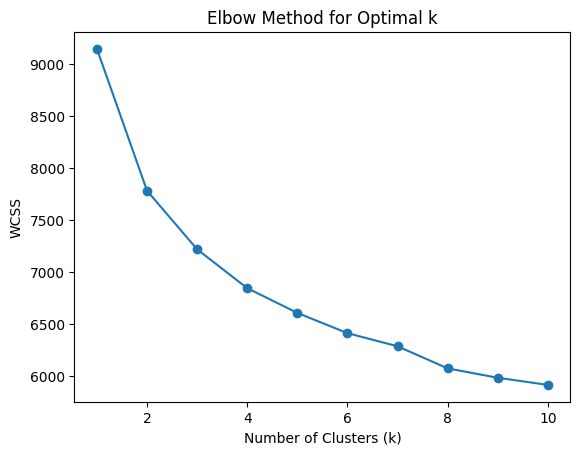

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


val_embeddings = model.encode(val_sentences)

wcss = []
for i in range(1, 11):  # Test k values from 1 to 10
   kmeans = KMeans(n_clusters=i, random_state=42)
   kmeans.fit(val_embeddings)  # Use your validation embeddings
   wcss.append(kmeans.inertia_)  # Inertia is WCSS

plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.show()

We think 8 clusters may be the best amount

We search for the best hyperparameters as we did before, but we noticed that certain settings were working well before, so we adjust the grid accordingly:

In [ ]:
# We do grid search

params = {
    'batch_size': 33,
    'pos_neg_ratio': 3,
    'warmup_steps': 50
}

param_grid = {
    'epochs': [5, 15],
    'learning_rate': [1e-4, 1e-5],
}

silhouette_avg = {
    'epochs': [],
    'learning_rate': [],
    'silhouette_score': []
}

for epoch in param_grid['epochs']:
    for learning_rate in param_grid['learning_rate']:
       model = SentenceTransformer('all-MiniLM-L6-v2')
       train_dataloader = ContrastiveTensionDataLoader(train_sentences, batch_size=params['batch_size'], pos_neg_ratio=params['pos_neg_ratio'])
       train_loss = losses.ContrastiveTensionLoss(model=model)

       model.old_fit(
           train_objectives=[(train_dataloader, train_loss)],
           epochs=epoch,
           optimizer_params={'lr': learning_rate},
           warmup_steps=params['warmup_steps']
       )

       val_embeddings = model.encode(val_sentences)
       kmeans = KMeans(n_clusters=8, random_state=42)
       cluster_labels = kmeans.fit_predict(val_embeddings)
       silhouette_avg['silhouette_score'].append(silhouette_score(val_embeddings, cluster_labels))
       silhouette_avg['epochs'].append(epoch)
       silhouette_avg['learning_rate'].append(learning_rate)

       print(f"Epoch: {epoch}, Learning Rate: {learning_rate}, Silhouette Score: {silhouette_avg['silhouette_score'][-1]}")

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Epoch: 5, Learning Rate: 0.0001, Silhouette Score: 0.11440904438495636


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Epoch: 5, Learning Rate: 1e-05, Silhouette Score: 0.050732653588056564


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Epoch: 15, Learning Rate: 0.0001, Silhouette Score: 0.11964388191699982


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
argmax_index = np.argmax(silhouette_avg['silhouette_score'])
best_params = {

    'epochs': silhouette_avg['epochs'][argmax_index],
    'learning_rate': silhouette_avg['learning_rate'][argmax_index]
}
print(f"The best parameters are: {best_params} for score {silhouette_avg['silhouette_score'][argmax_index]}")

The best parameters are: {'epochs': 15, 'learning_rate': 0.0001} for score 0.11964388191699982


In [ ]:
#We train/fine-tune the model on half of "all_truncated_sentences" from the training data set
random.seed(42)
np.random.seed(42)

from sentence_transformers import SentenceTransformer, losses, datasets, InputExample
from sentence_transformers.losses import ContrastiveTensionDataLoader

model_final_patent = SentenceTransformer('all-MiniLM-L6-v2')
train_dataloader = ContrastiveTensionDataLoader(small_sent, batch_size=33, pos_neg_ratio=3)
train_loss = losses.ContrastiveTensionLoss(model=model_final_patent)

model_final_patent.old_fit(
    [(train_dataloader, train_loss)],
    epochs=15,
    optimizer_params={'lr': 0.0001},
    warmup_steps=50,
    show_progress_bar=True)


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration:   0%|          | 0/303 [00:00<?, ?it/s]

In [ ]:
#Save the model
model_save_path = '/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/S_BERT_patent.model'
model_final_patent.save(model_save_path)

In [ ]:
random.seed(42)
np.random.seed(42)

#create sentence embeddings
sentence_embeddings_patent = model_final_patent.encode(patent_test_sentence['clean_abstract'])

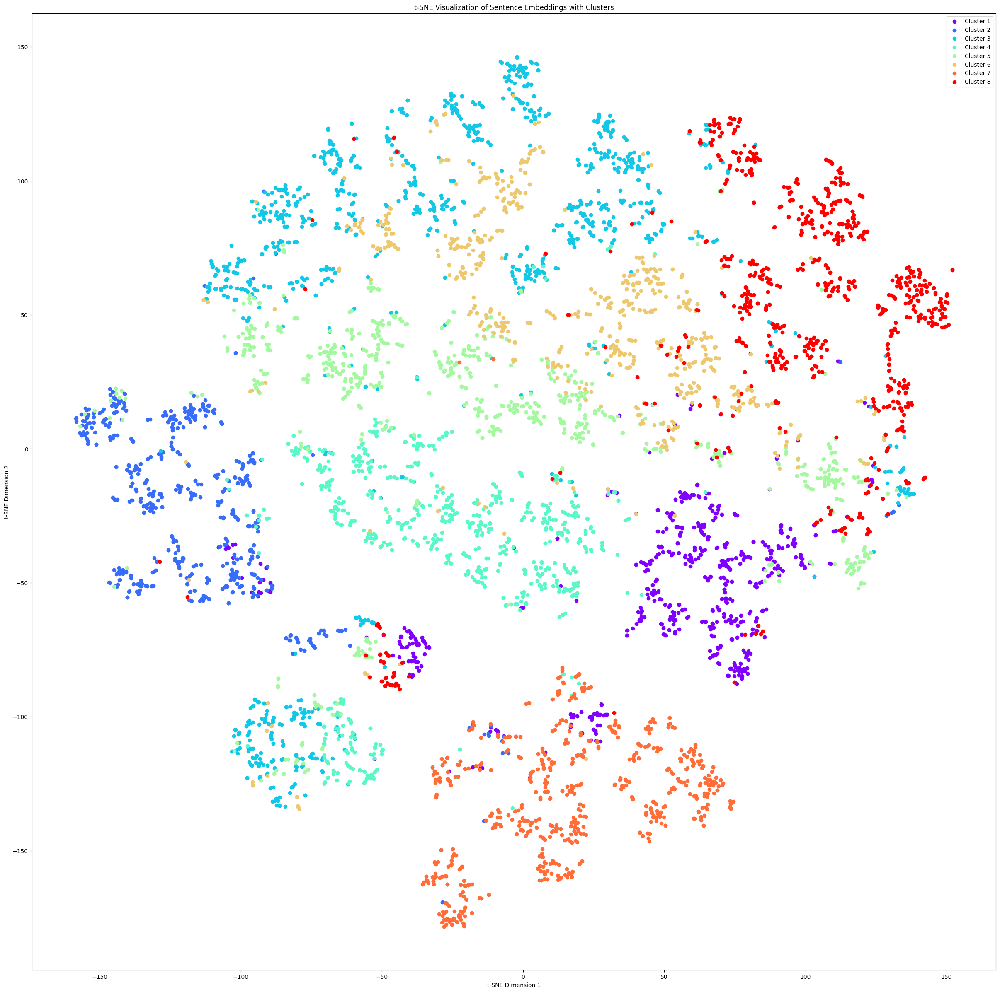

In [ ]:
random.seed(42)
np.random.seed(42)

#t-SNE Visualization

# We apply t-SNE:
tsne = TSNE(n_components=2, random_state=42, n_iter=5000, perplexity=10)
embeddings_2d = tsne.fit_transform(sentence_embeddings_patent)

# We prform clustering with K-means:
num_clusters = 8
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(sentence_embeddings_patent)

# We visualize with colored clusters:
colors = cm.rainbow(np.linspace(0, 1, num_clusters))
plt.figure(figsize=(30, 30))

# Plot points with cluster-specific colors
for i, color in zip(range(num_clusters), colors):
    cluster_points = embeddings_2d[cluster_labels == i] # Get points belonging to the current cluster
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], color=color, label=f'Cluster {i + 1}') # Plot with cluster color

# Plot:
plt.title('t-SNE Visualization of Sentence Embeddings with Clusters')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend()
plt.show()

We have very clear clusters. Let us examine the clearest and most distinct from the rest, which is cluster 2:

In [ ]:
# Load the spaCy model
nlp = spacy.load("en_core_web_sm")

# We try to investigate "sub-clusters" within clusters

# Data for cluster 2 (cluster_labels == 1)
cluster_2_data = sentence_embeddings_patent[cluster_labels == 1]

# Try 4 sub-clusters (or adjust as needed based on your analysis)
sub_kmeans = KMeans(n_clusters=4, random_state=42)
# Fit the sub_kmeans model to the cluster_2_data and get sub-cluster labels
sub_cluster_labels = sub_kmeans.fit_predict(cluster_2_data)

# Get indices for cluster 2 (cluster_labels == 1)
cluster_2_indices = np.where(cluster_labels == 1)[0]

for sub_cluster_id in range(4):  # Iterate through sub-clusters
    # Get indices of sentences in this sub-cluster
    # Use sub_cluster_labels computed for cluster_2_data
    sub_cluster_indices_in_cluster_2 = cluster_2_indices[sub_cluster_labels == sub_cluster_id]

    # Access original sentences from media_test_sentence using the indices
    original_sentences = patent_test_sentence.iloc[sub_cluster_indices_in_cluster_2]['clean_abstract']

    print(f"Sub-cluster {sub_cluster_id}:")

    # Named Entity Recognition
    company_names = []
    for sentence in original_sentences:
        doc = nlp(sentence)
        for ent in doc.ents:
            if ent.label_ == "ORG":  # Extract organizations (company names)
                company_names.append(ent.text)

    # Print company names with frequency
    print(Counter(company_names).most_common(10))  # Print top 10 most frequent company names
    print("\n")

/usr/local/lib/python3.10/dist-packages/spacy/util.py:1740: UserWarning: [W111] Jupyter notebook detected: if using `prefer_gpu()` or `require_gpu()`, include it in the same cell right before `spacy.load()` to ensure that the model is loaded on the correct device. More information: http://spacy.io/usage/v3#jupyter-notebook-gpu
  warnings.warn(Warnings.W111)


Sub-cluster 0:
[('control module', 6), ('ldp', 4), ('cnn', 4), ('ac', 3), ('the internal circuit board', 2), ('rgb', 2), ('gnn', 2), ('the gnn module performs node information fusion', 2), ('fed', 2), ('personnel&#39;s access department', 1)]


Sub-cluster 1:
[('skpfm', 4), ('silicon micro powder', 2), ('the anomaly detection model', 2), ('washs photovoltaic module', 1), ('the silicon micro powder', 1), ('vision module', 1), ('micron', 1), ('the photovoltaic module steel cable', 1), ('the bipv photovoltaic module', 1), ('photovoltaic power plant&#39;s', 1)]


Sub-cluster 2:
[('ems', 3), ('usb', 2), ('hplc', 2), ('s1', 1), ('control module', 1), ('the electric energy conversion module', 1), ('the electric quantity detection module', 1), ('node module', 1), ('photovoltaic board', 1)]


Sub-cluster 3:
[('usb', 4), ('dns', 1), ('the electric energy acquisition module', 1), ('control module', 1), ('the house internal data information', 1), ('power micro-energy', 1), ('rs232', 1)]




In [ ]:
# Get indices for cluster 2 (cluster_labels == 1)
cluster_2_indices = np.where(cluster_labels == 1)[0]

for sub_cluster_id in range(4):  # Iterate through sub-clusters
    # Get indices of sentences in this sub-cluster
    sub_cluster_indices_in_cluster_2 = cluster_2_indices[sub_cluster_labels == sub_cluster_id]

    # Access original sentences from media_test_sentence using the indices
    original_sentences = patent_test_sentence.iloc[sub_cluster_indices_in_cluster_2]['clean_abstract']

    print(f"Sub-cluster {sub_cluster_id}:")

    # Combine sentences in the sub-cluster into a single document
    document = ' '.join(original_sentences.tolist())

    # Extract keywords using KeyBERT
    keywords = kw_model.extract_keywords(document, keyphrase_ngram_range=(1, 2), top_n=10)  # Adjust ngram_range and top_n as needed

    print(keywords)
    print("\n")

Sub-cluster 0:
[('hydropower clearing', 0.5386), ('electricity control', 0.5144), ('solar control', 0.5071), ('controlling solar', 0.5055), ('controlled utility', 0.4915), ('clearing price', 0.4906), ('power management', 0.4815), ('hydropower market', 0.4727), ('solar application', 0.4711), ('power market', 0.4675)]


Sub-cluster 1:
[('photovoltaic utility', 0.6677), ('photovoltaics utility', 0.6621), ('photovoltaics method', 0.6577), ('method photovoltaic', 0.654), ('photovoltaic device', 0.6492), ('photovoltaic support', 0.6491), ('supporting photovoltaic', 0.6459), ('photovoltaic supports', 0.6393), ('support photovoltaic', 0.638), ('provide photovoltaic', 0.6352)]


Sub-cluster 2:
[('combustibility invention', 0.5439), ('identifying combustibility', 0.5338), ('combustibility hydrogen', 0.5318), ('combustibility gas', 0.5235), ('gas cloud', 0.5217), ('combustibility trf', 0.518), ('hydrogen sensor', 0.5159), ('hydrogen sensors', 0.5142), ('alarming hydrogen', 0.4946), ('trf combusti

sub-cluster 1 refers to a silicon photovoltaic component that seem recurrent. There are also mentions of photovoltaic boards in sub-cluster 2. When looking at keywords related to sub-cluster 1 we understand that this specific sub-component is related to energy control in hydropower and photovoltaic panel

#### 4.1.3. Media and Patent Datasets

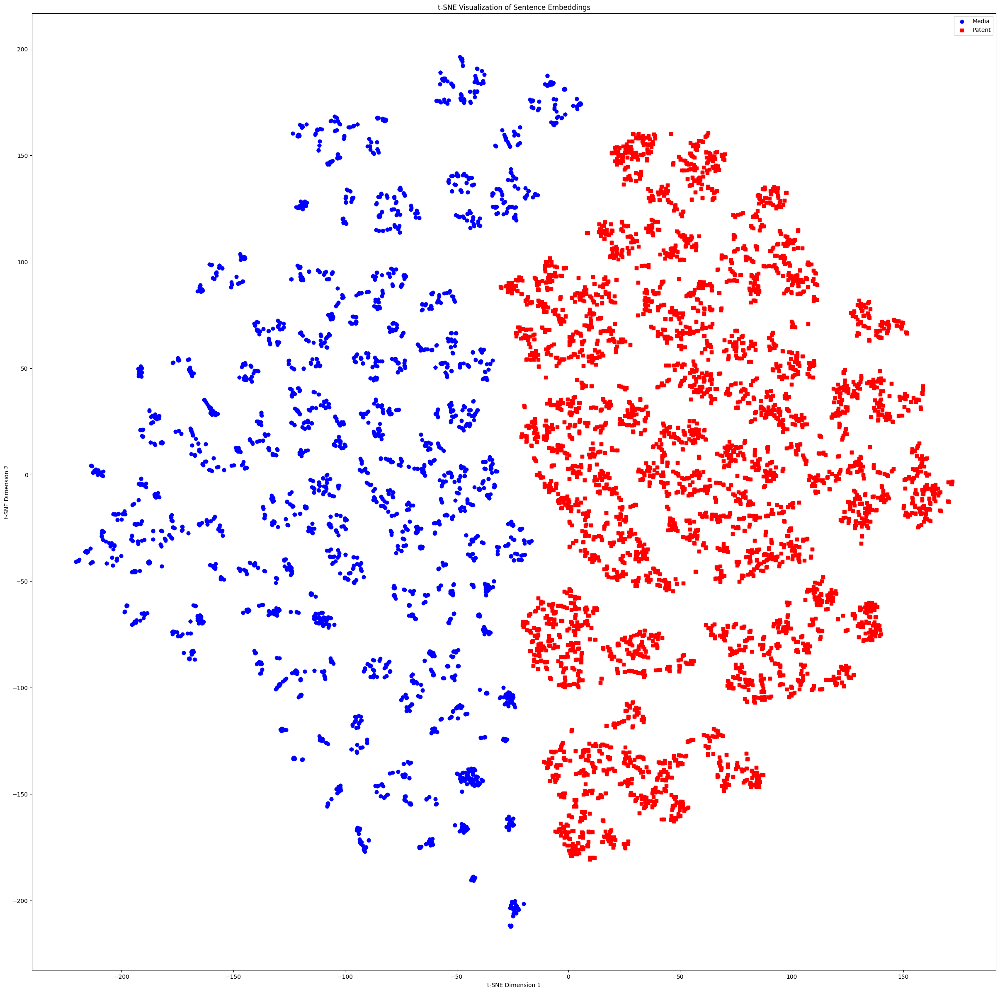

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.cm as cm

# Assuming you have 'sentence_embeddings_media' and 'sentence_embeddings_patent'

# Concatenate embeddings
combined_embeddings = np.concatenate([sentence_embeddings_media, sentence_embeddings_patent])

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, n_iter=5000, perplexity=10)
embeddings_2d = tsne.fit_transform(combined_embeddings)

# Optional: KMeans clustering (if you still want to calculate clusters)
num_clusters = 10
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(combined_embeddings)

# Visualization
plt.figure(figsize=(30, 30))

# Separate embeddings for media and patent
media_embeddings_2d = embeddings_2d[:sentence_embeddings_media.shape[0]]
patent_embeddings_2d = embeddings_2d[sentence_embeddings_media.shape[0]:]

# Plot with distinct colors for media and patent
plt.scatter(media_embeddings_2d[:, 0], media_embeddings_2d[:, 1], color='blue', marker='o', label='Media')
plt.scatter(patent_embeddings_2d[:, 0], patent_embeddings_2d[:, 1], color='red', marker='s', label='Patent')

# Plot:
plt.title('t-SNE Visualization of Sentence Embeddings')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend()
plt.show()

  This visualization seems to confirm that embeddings are in different spaces and that not many themes seem to overalp between the two datasets.

## 5. Conclusion

It appears that overall there is very little overlap between the two datasets. We can however distinguish some clear trends and recurring themes in both data sets that could be even further explored. Doc2Vec, in this regard, seemed to be the most promising model since it found quite a few overlaps between the two data sets' sentence embeddings.

---

---

---

# Annex

This is an attempt at using DistilBERT as an additional word embeddings model. It remains in annex as it could not be kept for the final work.

## DistilBert Model for word embeddings

DistilBERT is a smaller, distilled version of BERT that retains 97% of the performance while reducing the size by 60% and being 2x faster. This model allows us to fit the model on all the training data unlike larger ones.

In [ ]:
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification
model_name = "distilbert-base-uncased"
tokenizer = DistilBertTokenizer.from_pretrained(model_name)
model = DistilBertForSequenceClassification.from_pretrained(model_name)

### Evaluate the model before fine-tuning

We are more interested in relatedness (words that are associated, without being synonyms and not only similarity), so we use a dataset more adapted for this use case and we subset it for specific topics:

With our subset of wordnet words, the model does not appear to be very good at word similarity tasks:

In [ ]:
import nltk
from nltk.corpus import wordnet as wn
from nltk.corpus import wordnet_ic
from transformers import DistilBertTokenizer, DistilBertModel
from sklearn.metrics.pairwise import cosine_similarity
import torch
import numpy as np
from scipy.stats import spearmanr
import random

# Download necessary NLTK data
nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('wordnet_ic')

# Load WordNet IC file
brown_ic = wordnet_ic.ic('ic-brown.dat')

# Define DistilBERT model and tokenizer
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
model = DistilBertModel.from_pretrained('distilbert-base-uncased')

# Check for GPU availability and move model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Get a list of all words in WordNet
all_words = set(word.name() for synset in list(wn.all_synsets()) for word in synset.lemmas())

# Sample 500 random words from the set of all words
random_words = random.sample(all_words, 200)

# Function to get word embeddings from DistilBERT (modified for GPU)
def get_word_embedding(word):
    inputs = tokenizer(word, return_tensors='pt').to(device)  # Move input to device
    with torch.no_grad():
        outputs = model(**inputs)
    # Use the mean of token embeddings
    embedding = outputs.last_hidden_state.mean(dim=1).cpu().numpy()  # Move output back to CPU
    return embedding

# Run similarity calculation for randomly sampled words
similarities = []
for i in range(len(random_words)):
    for j in range(i + 1, len(random_words)):
        word1 = random_words[i]
        word2 = random_words[j]

        # Get synsets for the words
        synset1 = wn.synsets(word1)
        synset2 = wn.synsets(word2)

        if synset1 and synset2:
            # Use the first lemma of the first synset for each word
            word1 = synset1[0].lemmas()[0].name()
            word2 = synset2[0].lemmas()[0].name()

            # Compute human similarity using WordNet path similarity
            human_similarity = synset1[0].path_similarity(synset2[0])

            # Compute DistilBERT similarity
            embedding1 = get_word_embedding(word1)
            embedding2 = get_word_embedding(word2)
            distilbert_similarity = cosine_similarity(embedding1, embedding2)[0][0]

            similarities.append((human_similarity, distilbert_similarity))

# Calculate Spearman's correlation
human_similarities = [sim[0] for sim in similarities]
distilbert_similarities = [sim[1] for sim in similarities]
correlation = spearmanr(human_similarities, distilbert_similarities).correlation

print(f"Spearman's correlation: {correlation}")

The same is true when specific topics are considered (directly related to cleantech):

In [ ]:
import nltk
from nltk.corpus import wordnet as wn
from nltk.corpus import wordnet_ic
from transformers import DistilBertTokenizer, DistilBertModel
from sklearn.metrics.pairwise import cosine_similarity
import torch
import numpy as np
from scipy.stats import spearmanr

# Download necessary NLTK data
nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('wordnet_ic')

# Load WordNet IC file
brown_ic = wordnet_ic.ic('ic-brown.dat')

# Define DistilBERT model and tokenizer
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
model = DistilBertModel.from_pretrained('distilbert-base-uncased')

# Topics to find synsets
topics = ['energy', 'environment', 'climate', 'renewable', 'wind', 'solar', 'battery', 'hydrogen', 'gas', 'green',
          'power', 'biogas', 'electricity', 'grid', 'water', 'hydraulic', 'panel', 'lithium', 'oil', 'vehicle', 'fuel',
          'heating', 'cell', 'turbine', 'platform', 'sunlight', 'silicon']

# Get relevant synsets
relevant_synsets = []
for topic in topics:
    topic_synsets = wn.synsets(topic)
    relevant_synsets.extend(topic_synsets)

print(f"Number of synsets related to the topics: {len(relevant_synsets)}")

# Function to get word embeddings from DistilBERT
def get_word_embedding(word):
    inputs = tokenizer(word, return_tensors='pt')
    with torch.no_grad():
        outputs = model(**inputs)
    # Use the mean of token embeddings
    embedding = outputs.last_hidden_state.mean(dim=1).numpy()
    return embedding

# Run similarity calculation
similarities = []
for i in range(len(relevant_synsets)):
    for j in range(i + 1, len(relevant_synsets)):
        synset1 = relevant_synsets[i]
        synset2 = relevant_synsets[j]

        word1 = synset1.lemmas()[0].name()
        word2 = synset2.lemmas()[0].name()

        # Compute human similarity
        human_similarity = synset1.path_similarity(synset2)
        if human_similarity is not None:
            embedding1 = get_word_embedding(word1)
            embedding2 = get_word_embedding(word2)

            # Compute cosine similarity
            cosine_sim = cosine_similarity(embedding1.reshape(1, -1), embedding2.reshape(1, -1))[0][0]
            similarities.append((cosine_sim, human_similarity))

# Analyze results
cosine_similarities = [sim[0] for sim in similarities]
human_similarities = [sim[1] for sim in similarities]

spearman_correlation, _ = spearmanr(cosine_similarities, human_similarities)

print(f"Spearman Correlation: {spearman_correlation:.3f}")


Using RG65 as another dataset for testing, we do however get a much better result with a similarity score of 0.5 which means that DistilBERT gives scores that are relatively close to the human ground-truth in this case:

In [ ]:
import torch

def get_word_embedding(word, tokenizer, model):
    # Tokenize the word
    inputs = tokenizer(word, return_tensors='pt', truncation=True, padding=True)

    # Pass the input through the model
    with torch.no_grad():
        outputs = model(**inputs)

    # Extract embeddings from the last hidden state
    # Use the embedding for the first token ([CLS] or the single word itself)
    word_embedding = outputs.last_hidden_state[:, 0, :].squeeze(0).numpy()  # (dim,)
    return word_embedding

from sklearn.metrics.pairwise import cosine_similarity

def compute_similarity_distilbert(word1, word2, tokenizer, model):
    # Get embeddings for the two words
    embedding1 = get_word_embedding(word1, tokenizer, model)
    embedding2 = get_word_embedding(word2, tokenizer, model)

    # Compute cosine similarity
    similarity = cosine_similarity(embedding1.reshape(1, -1), embedding2.reshape(1, -1))[0, 0]
    return similarity

rg65["DistilBERT_Similarity"] = rg65.apply(
    lambda row: compute_similarity_distilbert(row["Word1"], row["Word2"], tokenizer, model),
    axis=1
)

from scipy.stats import spearmanr, pearsonr

# Drop rows with missing embeddings
rg65.dropna(subset=["DistilBERT_Similarity"], inplace=True)

# Normalize similarity scores
rg65["Normalized_Similarity"] = rg65["Similarity"] / 4.0

# Compute correlations
pearson_corr, _ = pearsonr(rg65["Normalized_Similarity"], rg65["DistilBERT_Similarity"])
spearman_corr, _ = spearmanr(rg65["Normalized_Similarity"], rg65["DistilBERT_Similarity"])

print(f"Pearson Correlation: {pearson_corr:.3f}")
print(f"Spearman Correlation: {spearman_corr:.3f}")

In [ ]:
### Load the datasets

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!pwd
!ls '/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/'
media_train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/media_train.csv')
media_test = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/media_test.csv')
patent_train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/patent_train.csv')
patent_test = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/patent_test.csv')

In [ ]:
# Make sure to have actual python lists in the relevant columns:
media_train['tokens'] = media_train['tokens'].apply(eval)
patent_train['tokens'] = patent_train['tokens'].apply(eval)
media_test['tokens'] = media_test['tokens'].apply(eval)
patent_test['tokens'] = patent_test['tokens'].apply(eval)

### Fine-Tune the Model

### For Media Data:

Before fine-tuning, we need to set labels. The most straightforward way to proceed is to use the average cosine similarity score between media articles as the "similarity_score":

In [ ]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer

# Load pre-trained model for sentence embeddings (DistilBERT or any other model)
sentence_model = SentenceTransformer('distilbert-base-uncased')

# Compute sentence embeddings for each article in media_train
sentence_embeddings = sentence_model.encode(media_train['tokens'].tolist())

# Compute the pairwise cosine similarity between the sentence embeddings
similarity_matrix = cosine_similarity(sentence_embeddings)

# Compute average similarity for each article with all others
average_similarity_scores = similarity_matrix.mean(axis=1)

# Add the average similarity scores as a new column to the dataframe
media_train['average_similarity_score'] = average_similarity_scores

In [ ]:
media_train.head(5)

,title,date,content,domain,url,tokens,average_similarity_score
0,climate activists win court battle over north ...,2024-01-19,climate activists won court case norway state ...,energyvoice,https://www.energyvoice.com/oilandgas/north-se...,"['climate', 'activists', 'won', 'court', 'case...",0.986239
1,solar project development costs ‘ increased by...,2023-02-20,solar project development costs increase upwar...,solarpowerportal.co,https://www.solarpowerportal.co.uk/solar_proje...,"['solar', 'project', 'development', 'costs', '...",0.986955
2,copenhagen infrastructure partners invests pou...,2024-04-04,copenhagen infrastructure partners cip announc...,solarquarter,https://solarquarter.com/2024/04/04/copenhagen...,"['copenhagen', 'infrastructure', 'partners', '...",0.987013
3,energy reliability energy management downloads,2023-06-13,need reliable energy storage solution solar tu...,energy-xprt,https://www.energy-xprt.com/energy-management/...,"['need', 'reliable', 'energy', 'storage', 'sol...",0.987288
4,steam turbines companies and suppliers energy ...,2023-06-15,ware provide industry leading service includin...,energy-xprt,https://www.energy-xprt.com/energy-management/...,"['ware', 'provide', 'industry', 'leading', 'se...",0.982787


In [ ]:
## It looks like the similarity is high across the dataset, which may be possible considering the common themes in articles:

# Set a similarity threshold
threshold = 0.9

# Filter out articles that have a similarity score below the threshold
high_similarity_articles = media_train[media_train['average_similarity_score'] > threshold]

print(len(high_similarity_articles))
len(media_train)

16086


16086

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import DistilBertTokenizer

# Initialize the tokenizer
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')


class WordDataset(Dataset):
    def __init__(self, tokens, labels, tokenizer, max_length=128):
        self.tokens = tokens
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.tokens)

    def __getitem__(self, idx):
        tokens = self.tokens[idx]
        labels = self.labels[idx]

        # Tokenize the input tokens (convert to input IDs)
        inputs = self.tokenizer(
            tokens,
            padding='max_length',
            truncation=True,
            max_length=self.max_length,
            return_tensors='pt'
        )

        # Flatten the input tensors for easier batching
        input_ids = inputs['input_ids'].squeeze(0)  # Remove batch dimension
        attention_mask = inputs['attention_mask'].squeeze(0)

        return {
            'input_ids': input_ids,
            'attention_mask': attention_mask,
            'labels': torch.tensor(labels, dtype=torch.float32)  # Assuming the labels are numerical
        }


In [ ]:
from transformers import DistilBertModel
import torch.nn as nn

class DistilBertForSimilarity(nn.Module):
    def __init__(self, pretrained_model_name='distilbert-base-uncased'):
        super(DistilBertForSimilarity, self).__init__()
        self.distilbert = DistilBertModel.from_pretrained(pretrained_model_name)
        self.regressor = nn.Linear(self.distilbert.config.hidden_size, 1)  # Regression head for similarity score

    def forward(self, input_ids, attention_mask):
        # Forward pass through DistilBERT
        outputs = self.distilbert(input_ids=input_ids, attention_mask=attention_mask)
        hidden_state = outputs.last_hidden_state[:, 0, :]  # Take the [CLS] token

        # Pass the hidden state through the regressor (linear layer)
        output = self.regressor(hidden_state)
        return output


In [ ]:
# Prepare the data (assuming you have labels as well)
# Replace media_train['similarity_scores'] with your similarity values if available
labels = media_train['average_similarity_score']  # This should be a numerical column

train_dataset = WordDataset(tokens=media_train['tokens'], labels=labels, tokenizer=tokenizer)
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)

In [ ]:
from transformers import AdamW
from torch.optim import Adam
from torch.nn import MSELoss
import torch

# Initialize the model and move it to GPU (if available)
model = DistilBertForSimilarity()
model.to('cuda')  # Move to GPU if available

# Loss and optimizer
optimizer = AdamW(model.parameters(), lr=5e-5)
loss_fn = MSELoss()  # Mean Squared Error for regression

# Training loop
epochs = 3
for epoch in range(epochs):
    model.train()
    total_loss = 0
    for batch in train_dataloader:
        # Move tensors to GPU if available
        input_ids = batch['input_ids'].to('cuda')
        attention_mask = batch['attention_mask'].to('cuda')
        labels = batch['labels'].to('cuda')

        optimizer.zero_grad()

        # Forward pass
        outputs = model(input_ids, attention_mask)

        # Compute loss
        loss = loss_fn(outputs.squeeze(-1), labels)  # Squeeze to match the shape of labels
        total_loss += loss.item()

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

    avg_loss = total_loss / len(train_dataloader)
    print(f"Epoch {epoch+1}/{epochs}, Loss: {avg_loss:.4f}")

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Epoch 1/3, Loss: 0.0013
Epoch 2/3, Loss: 0.0001
Epoch 3/3, Loss: 0.0001


In [ ]:
# Save the model's state dictionary
from google.colab import drive
drive.mount('/content/drive')
torch.save(model.state_dict(), '/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/distilbert_similarity_model.pth')

"""
PREVIOUS VERSION
# Specify the directory to save the model
save_directory = "/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/distilbert_model"

# Save the model and tokenizer
model.save_pretrained(save_directory)
tokenizer.save_pretrained(save_directory)
print(f"Model and tokenizer saved to: {save_directory}")
"""

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


'\nPREVIOUS VERSION\n# Specify the directory to save the model\nsave_directory = "/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/distilbert_model"\n\n# Save the model and tokenizer\nmodel.save_pretrained(save_directory)\ntokenizer.save_pretrained(save_directory)\nprint(f"Model and tokenizer saved to: {save_directory}")\n'

In [ ]:
# Load the saved state dictionary
model = DistilBertForSimilarity()  # Initialize a new model of the same architecture
model.load_state_dict(torch.load('/content/drive/MyDrive/distilbert_similarity_model.pth'))
"""
PREVIOUS VERSION
# For loading the model and the tokenizer:

from transformers import DistilBertTokenizer, DistilBertModel

load_directory = "/content/drive/MyDrive/Colab Notebooks/Computational Language Technologies/content/distilbert_model"  # The same directory where you saved it
tokenizer = DistilBertTokenizer.from_pretrained(load_directory)
model = DistilBertModel.from_pretrained(load_directory)
""""

### Test the Model

In [ ]:
# Check if GPU is available
if torch.cuda.is_available():
    device = torch.device('cuda')
    print('GPU is available and being used.')
else:
    device = torch.device('cpu')
    print('GPU not available, using CPU instead.')

In [ ]:
# OLD CODE
"""
import torch
from transformers import DistilBertTokenizer, DistilBertModel
import pandas as pd

# Move model to the GPU
model.to(device)

# Ensure the model is in evaluation mode (to not do dropouts, batch normalization or gradient calculation)
model.eval()

# Function to convert tokens to embeddings (unchanged)
def get_sentence_embedding(tokens, tokenizer, model, device):
    # Join tokens back into a sentence
    sentence = ' '.join(tokens)

    # Tokenize the sentence and convert to PyTorch tensors
    inputs = tokenizer(sentence, return_tensors='pt', truncation=True, padding=True, max_length=512).to(device)

    # Forward pass through the model
    with torch.no_grad():  # Disable gradient calculations for efficiency
        outputs = model(**inputs)  # Outputs include hidden states

    # Extract the CLS token embedding (for sentence-level representation)
    cls_embedding = outputs.last_hidden_state[:, 0, :]  # Shape: [1, hidden_size]

    # Move the tensor to CPU before converting to NumPy
    return cls_embedding.cpu().squeeze().numpy()  # Convert to numpy array

# Apply the function to your DataFrame's 'tokens' column
media_test['embeddings'] = media_test['tokens'].apply(
    lambda x: get_sentence_embedding(x, tokenizer, model, device)  # Pass device to the function
)

"""


In [ ]:
from transformers import DistilBertTokenizer

tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')  # If not already initialized

# Assuming 'media_test' is your DataFrame
test_encodings = tokenizer(
    media_test['tokens'].tolist(),
    truncation=True,
    padding=True,
    return_tensors='pt'  # Return PyTorch tensors
)

from torch.utils.data import DataLoader, TensorDataset

test_dataset = TensorDataset(test_encodings['input_ids'], test_encodings['attention_mask'])
test_dataloader = DataLoader(test_dataset, batch_size=16)  # Adjust batch size as needed

model.eval()

predicted_scores = []

with torch.no_grad():  # Disable gradient calculation during inference
    for batch in test_dataloader:  # Or loop through individual samples if not using DataLoader
        input_ids, attention_mask = batch  # Unpack the batch
        input_ids = input_ids.to('cuda')  # Move to GPU if available
        attention_mask = attention_mask.to('cuda')

        outputs = model(input_ids, attention_mask)
        predicted_scores.extend(outputs.squeeze(-1).cpu().numpy())  # Get predictions and move to CPU

Now to compare to the "true" scores, we calculate the average cosine similarity across articles as we did for the train data:

In [ ]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer

# Load pre-trained model for sentence embeddings (DistilBERT or any other model)
sentence_model = SentenceTransformer('distilbert-base-uncased')

# Compute sentence embeddings for each article in media_train
sentence_embeddings = sentence_model.encode(media_test['tokens'].tolist())

# Compute the pairwise cosine similarity between the sentence embeddings
similarity_matrix = cosine_similarity(sentence_embeddings)

# Compute average similarity for each article with all others
average_similarity_scores = similarity_matrix.mean(axis=1)

# Add the average similarity scores as a new column to the dataframe
media_test['average_similarity_score'] = average_similarity_scores
true_scores = media_test['average_similarity_score']

In [ ]:
from scipy.stats import pearsonr, spearmanr # Import spearmanr from scipy.stats
from sklearn.metrics import mean_squared_error # Keep other imports

# Assuming 'true_scores' contains the ground truth similarity scores
mse = mean_squared_error(true_scores, predicted_scores)
pearson_corr, _ = pearsonr(true_scores, predicted_scores)
spearman_corr, _ = spearmanr(true_scores, predicted_scores)

print(f"MSE: {mse:.4f}")
print(f"Pearson Correlation: {pearson_corr:.4f}")
print(f"Spearman Correlation: {spearman_corr:.4f}")

MSE: 0.0000
Pearson Correlation: 0.6331
Spearman Correlation: 0.4766


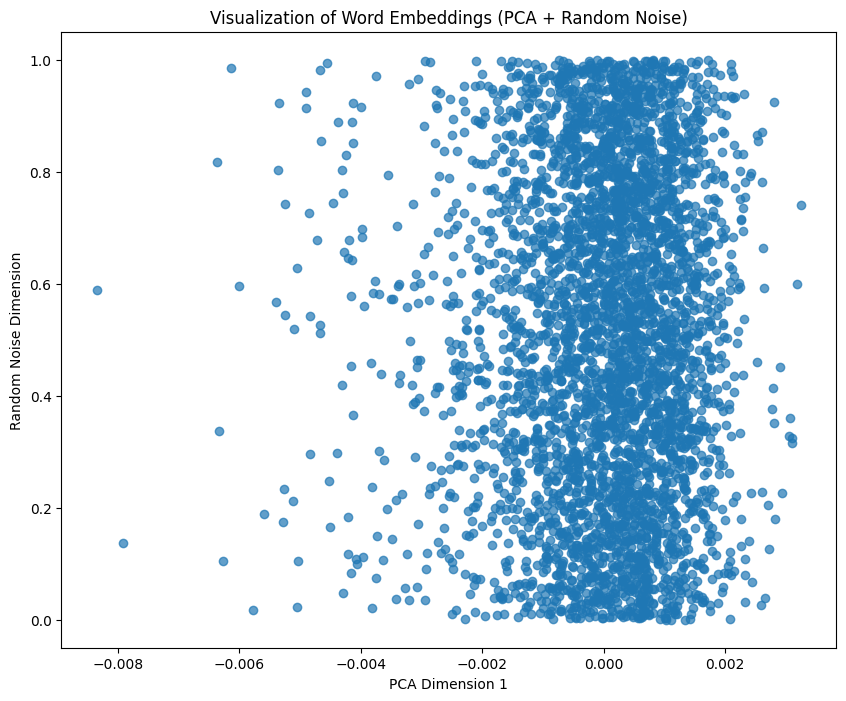

In [ ]:
from sklearn.manifold import TSNE  # or import umap.UMAP as UMAP
import matplotlib.pyplot as plt
import numpy as np # Import numpy
from sklearn.decomposition import PCA
import random

# Assuming 'predicted_scores' are your word embeddings
# ... (Your code to obtain 'predicted_scores')

# Apply t-SNE or UMAP
predicted_scores = np.array(predicted_scores) # Convert predicted_scores to a numpy array
predicted_scores = predicted_scores.reshape(-1, 1) # Reshape to 2D array with one feature per sample

# Use PCA to reduce to 1 dimension
pca = PCA(n_components=1)
reduced_embeddings_pca = pca.fit_transform(predicted_scores)

# Create a second dimension with random noise
second_dimension = [random.uniform(0, 1) for _ in range(len(reduced_embeddings_pca))]

# Combine the dimensions
reduced_embeddings = np.column_stack((reduced_embeddings_pca, second_dimension))

# Visualization
plt.figure(figsize=(10, 8))
plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], alpha=0.7)
plt.title('Visualization of Word Embeddings (PCA + Random Noise)')
plt.xlabel('PCA Dimension 1')
plt.ylabel('Random Noise Dimension')
plt.show()